[![Flyability Banner](https://raw.githubusercontent.com/ChristopherJulien/Probe-Detection-Using-Deep-Learning/google_collab/flyabilty_banner.png)](https://github.com/ChristopherJulien/Probe-Detection-Using-Deep-Learning/tree/google_collab)



## ⚠️ Disclaimer

These notebooks were inspired and used from [here](https://github.com/roboflow/notebooks/).

## Pro Tip: Use GPU Acceleration

If you are running this notebook in Google Colab, navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`. This will ensure your notebook uses a GPU, which will significantly speed up model training times.



# Training RT-DETR


---

[![arXiv](https://img.shields.io/badge/arXiv-2304.08069-b31b1b.svg)](https://arxiv.org/pdf/2304.08069.pdf)
[![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/lyuwenyu/RT-DETR)

RT-DETR, short for "Real-Time DEtection TRansformer", is a computer vision model developed by Peking University and Baidu. In their paper, "DETRs Beat YOLOs on Real-time Object Detection" the authors claim that RT-DETR can outperform YOLO models in object detection, both in terms of speed and accuracy. The model has been released under the Apache 2.0 license, making it a great option, especially for enterprise projects.

![RT-DETR Figure.1](https://storage.googleapis.com/com-roboflow-marketing/notebooks/examples/rt-detr-figure-1.png)

Recently, RT-DETR was added to the `transformers` library, significantly simplifying its fine-tuning process. In this tutorial, we will show you how to train RT-DETR on a custom dataset.

## Setup

### Configure your API keys

To fine-tune RT-DETR, you need to provide your HuggingFace Token and Roboflow API key. Follow these steps:

- Open your [`HuggingFace Settings`](https://huggingface.co/settings) page. Click `Access Tokens` then `New Token` to generate new token.
- Go to your [`Roboflow Settings`](https://app.roboflow.com/settings/api) page. Click `Copy`. This will place your private key in the clipboard.
- In Colab, go to the left pane and click on `Secrets` (🔑).
    - Store HuggingFace Access Token under the name `HF_TOKEN`.
    - Store Roboflow API Key under the name `ROBOFLOW_API_KEY`.

### Select the runtime

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `L4 GPU`, and then click `Save`.

In [ ]:
!nvidia-smi

Wed Jan  8 11:35:02 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   62C    P8              11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

**NOTE:** To make it easier for us to manage datasets, images and models we create a `HOME` constant.

In [ ]:
import os
HOME = os.getcwd()
print("HOME:", HOME)

HOME: /content


### Install dependencies

In [ ]:
!pip install -q git+https://github.com/huggingface/transformers.git
!pip install -q git+https://github.com/roboflow/supervision.git
!pip install -q accelerate
!pip install -q roboflow
!pip install -q torchmetrics
!pip install -q "albumentations>=1.4.5"

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


### Imports

In [ ]:
import torch
import requests

import numpy as np
import supervision as sv
import albumentations as A

from PIL import Image
from pprint import pprint
from roboflow import Roboflow
from dataclasses import dataclass, replace
from google.colab import userdata
from torch.utils.data import Dataset
from transformers import (
    AutoImageProcessor,
    AutoModelForObjectDetection,
    TrainingArguments,
    Trainer
)
from torchmetrics.detection.mean_ap import MeanAveragePrecision

## Inference with pre-trained RT-DETR model

In [ ]:
# @title Load model

CHECKPOINT = "PekingU/rtdetr_r50vd_coco_o365"
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = AutoModelForObjectDetection.from_pretrained(CHECKPOINT).to(DEVICE)
processor = AutoImageProcessor.from_pretrained(CHECKPOINT)


The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.48, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


## Fine-tune RT-DETR on custom dataset

In [ ]:
# @title Download dataset from Roboflow Universe

ROBOFLOW_API_KEY = userdata.get('ROBOFLOW_API_KEY')
rf = Roboflow(api_key=ROBOFLOW_API_KEY)

project = rf.workspace("julien-xkm5o").project("probe-detection-fly")
version = project.version(1)
dataset = version.download("coco")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Probe-Detection-FLY-1 in coco:: 100%|██████████| 748/748 [00:00<00:00, 2449.89it/s]


In [ ]:
ds_train = sv.DetectionDataset.from_coco(
    images_directory_path=f"{dataset.location}/train",
    annotations_path=f"{dataset.location}/train/_annotations.coco.json",
)
ds_valid = sv.DetectionDataset.from_coco(
    images_directory_path=f"{dataset.location}/valid",
    annotations_path=f"{dataset.location}/valid/_annotations.coco.json",
)
ds_test = sv.DetectionDataset.from_coco(
    images_directory_path=f"{dataset.location}/test",
    annotations_path=f"{dataset.location}/test/_annotations.coco.json",
)

print(f"Number of training images: {len(ds_train)}")
print(f"Number of validation images: {len(ds_valid)}")
print(f"Number of test images: {len(ds_test)}")

Number of training images: 648
Number of validation images: 61
Number of test images: 31


BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBox

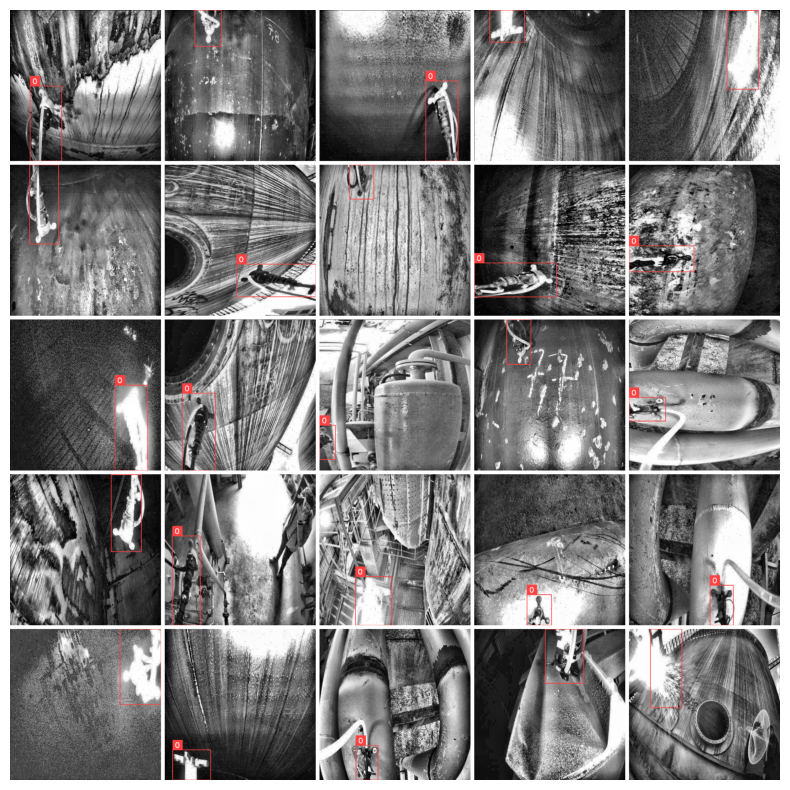

In [ ]:
# @title Display dataset sample

GRID_SIZE = 5

def annotate(image, annotations, classes):
    labels = [
        classes[class_id]
        for class_id
        in annotations.class_id
    ]

    bounding_box_annotator = sv.BoundingBoxAnnotator()
    label_annotator = sv.LabelAnnotator(text_scale=1, text_thickness=2)

    annotated_image = image.copy()
    annotated_image = bounding_box_annotator.annotate(annotated_image, annotations)
    annotated_image = label_annotator.annotate(annotated_image, annotations, labels=labels)
    return annotated_image

annotated_images = []
for i in range(GRID_SIZE * GRID_SIZE):
    _, image, annotations = ds_train[i]
    annotated_image = annotate(image, annotations, ds_train.classes)
    annotated_images.append(annotated_image)

grid = sv.create_tiles(
    annotated_images,
    grid_size=(GRID_SIZE, GRID_SIZE),
    single_tile_size=(400, 400),
    tile_padding_color=sv.Color.WHITE,
    tile_margin_color=sv.Color.WHITE
)
sv.plot_image(grid, size=(10, 10))

### Preprocess the data

To finetune a model, you must preprocess the data you plan to use to match precisely the approach used for the pre-trained model. [AutoImageProcessor](https://huggingface.co/docs/transformers/main/en/model_doc/auto#transformers.AutoImageProcessor) takes care of processing image data to create `pixel_values`, `pixel_mask`, and `labels` that a DETR model can train with. The image processor has some attributes that you won't have to worry about:

- `image_mean = [0.485, 0.456, 0.406 ]`
- `image_std = [0.229, 0.224, 0.225]`

These are the mean and standard deviation used to normalize images during the model pre-training. These values are crucial to replicate when doing inference or finetuning a pre-trained image model.

Instantiate the image processor from the same checkpoint as the model you want to finetune.

In [ ]:
IMAGE_SIZE = 480

processor = AutoImageProcessor.from_pretrained(
    CHECKPOINT,
    do_resize=True,
    size={"width": IMAGE_SIZE, "height": IMAGE_SIZE},
)

Before passing the images to the `processor`, apply two preprocessing transformations to the dataset:

- Augmenting images
- Reformatting annotations to meet RT-DETR expectations

First, to make sure the model does not overfit on the training data, you can apply image augmentation with any data augmentation library. Here we use [Albumentations](https://albumentations.ai/docs/). This library ensures that transformations affect the image and update the bounding boxes accordingly.

In [ ]:
train_augmentation_and_transform = A.Compose(
    [
        A.Perspective(p=0.1),
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.5),
        A.HueSaturationValue(p=0.1),
    ],
    bbox_params=A.BboxParams(
        format="pascal_voc",
        label_fields=["category"],
        clip=True,
        min_area=25
    ),
)

valid_transform = A.Compose(
    [A.NoOp()],
    bbox_params=A.BboxParams(
        format="pascal_voc",
        label_fields=["category"],
        clip=True,
        min_area=1
    ),
)

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


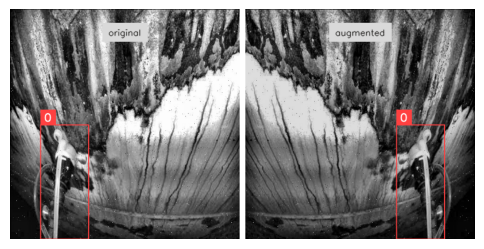

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


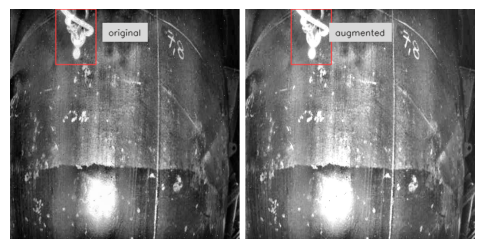

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


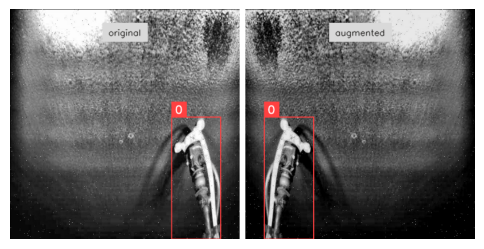

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


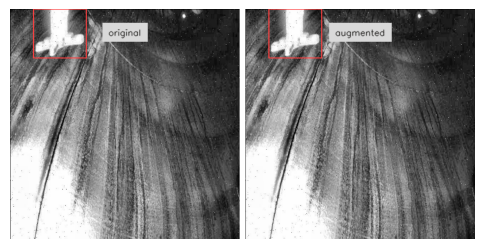

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


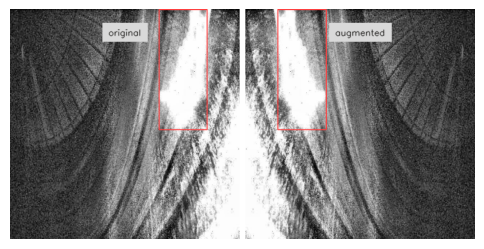

In [ ]:
# @title Visualize some augmented images

IMAGE_COUNT = 5

for i in range(IMAGE_COUNT):
    _, image, annotations = ds_train[i]

    output = train_augmentation_and_transform(
        image=image,
        bboxes=annotations.xyxy,
        category=annotations.class_id
    )

    augmented_image = output["image"]
    augmented_annotations = replace(
        annotations,
        xyxy=np.array(output["bboxes"]),
        class_id=np.array(output["category"])
    )

    annotated_images = [
        annotate(image, annotations, ds_train.classes),
        annotate(augmented_image, augmented_annotations, ds_train.classes)
    ]
    grid = sv.create_tiles(
        annotated_images,
        titles=['original', 'augmented'],
        titles_scale=0.5,
        single_tile_size=(400, 400),
        tile_padding_color=sv.Color.WHITE,
        tile_margin_color=sv.Color.WHITE
    )
    sv.plot_image(grid, size=(6, 6))

The `processor` expects the annotations to be in the following format: `{'image_id': int, 'annotations': List[Dict]}`, where each dictionary is a COCO object annotation. Let's add a function to reformat annotations for a single example:

In [ ]:
class PyTorchDetectionDataset(Dataset):
    def __init__(self, dataset: sv.DetectionDataset, processor, transform: A.Compose = None):
        self.dataset = dataset
        self.processor = processor
        self.transform = transform

    @staticmethod
    def annotations_as_coco(image_id, categories, boxes):
        annotations = []
        for category, bbox in zip(categories, boxes):
            x1, y1, x2, y2 = bbox
            formatted_annotation = {
                "image_id": image_id,
                "category_id": category,
                "bbox": [x1, y1, x2 - x1, y2 - y1],
                "iscrowd": 0,
                "area": (x2 - x1) * (y2 - y1),
            }
            annotations.append(formatted_annotation)

        return {
            "image_id": image_id,
            "annotations": annotations,
        }

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        _, image, annotations = self.dataset[idx]

        # Convert image to RGB numpy array
        image = image[:, :, ::-1]
        boxes = annotations.xyxy
        categories = annotations.class_id

        if self.transform:
            transformed = self.transform(
                image=image,
                bboxes=boxes,
                category=categories
            )
            image = transformed["image"]
            boxes = transformed["bboxes"]
            categories = transformed["category"]


        formatted_annotations = self.annotations_as_coco(
            image_id=idx, categories=categories, boxes=boxes)
        result = self.processor(
            images=image, annotations=formatted_annotations, return_tensors="pt")

        # Image processor expands batch dimension, lets squeeze it
        result = {k: v[0] for k, v in result.items()}

        return result

Now you can combine the image and annotation transformations to use on a batch of examples:

In [ ]:
pytorch_dataset_train = PyTorchDetectionDataset(
    ds_train, processor, transform=train_augmentation_and_transform)
pytorch_dataset_valid = PyTorchDetectionDataset(
    ds_valid, processor, transform=valid_transform)
pytorch_dataset_test = PyTorchDetectionDataset(
    ds_test, processor, transform=valid_transform)

pytorch_dataset_train[15]

{'pixel_values': tensor([[[0.0275, 0.0275, 0.0275,  ..., 0.0314, 0.0157, 0.0118],
          [0.0431, 0.0431, 0.0431,  ..., 0.0510, 0.0196, 0.0235],
          [0.0510, 0.0510, 0.0510,  ..., 0.1529, 0.0667, 0.0392],
          ...,
          [0.0118, 0.0157, 0.0157,  ..., 0.4118, 0.5451, 0.4902],
          [0.0118, 0.0157, 0.0157,  ..., 0.3216, 0.5137, 0.4941],
          [0.0118, 0.0157, 0.0157,  ..., 0.2588, 0.4824, 0.4863]],
 
         [[0.0275, 0.0275, 0.0275,  ..., 0.0314, 0.0157, 0.0118],
          [0.0431, 0.0431, 0.0431,  ..., 0.0510, 0.0196, 0.0235],
          [0.0510, 0.0510, 0.0510,  ..., 0.1529, 0.0667, 0.0392],
          ...,
          [0.0118, 0.0157, 0.0157,  ..., 0.4118, 0.5451, 0.4902],
          [0.0118, 0.0157, 0.0157,  ..., 0.3216, 0.5137, 0.4941],
          [0.0118, 0.0157, 0.0157,  ..., 0.2588, 0.4824, 0.4863]],
 
         [[0.0275, 0.0275, 0.0275,  ..., 0.0314, 0.0157, 0.0118],
          [0.0431, 0.0431, 0.0431,  ..., 0.0510, 0.0196, 0.0235],
          [0.0510, 0.051

You have successfully augmented the images and prepared their annotations. In the final step, create a custom collate_fn to batch images together.

In [ ]:
def collate_fn(batch):
    data = {}
    data["pixel_values"] = torch.stack([x["pixel_values"] for x in batch])
    data["labels"] = [x["labels"] for x in batch]
    return data

## Preparing function to compute mAP

In [ ]:
id2label = {id: label for id, label in enumerate(ds_train.classes)}
label2id = {label: id for id, label in enumerate(ds_train.classes)}


@dataclass
class ModelOutput:
    logits: torch.Tensor
    pred_boxes: torch.Tensor


class MAPEvaluator:

    def __init__(self, image_processor, threshold=0.00, id2label=None):
        self.image_processor = image_processor
        self.threshold = threshold
        self.id2label = id2label

    def collect_image_sizes(self, targets):
        """Collect image sizes across the dataset as list of tensors with shape [batch_size, 2]."""
        image_sizes = []
        for batch in targets:
            batch_image_sizes = torch.tensor(np.array([x["size"] for x in batch]))
            image_sizes.append(batch_image_sizes)
        return image_sizes

    def collect_targets(self, targets, image_sizes):
        post_processed_targets = []
        for target_batch, image_size_batch in zip(targets, image_sizes):
            for target, (height, width) in zip(target_batch, image_size_batch):
                boxes = target["boxes"]
                boxes = sv.xcycwh_to_xyxy(boxes)
                boxes = boxes * np.array([width, height, width, height])
                boxes = torch.tensor(boxes)
                labels = torch.tensor(target["class_labels"])
                post_processed_targets.append({"boxes": boxes, "labels": labels})
        return post_processed_targets

    def collect_predictions(self, predictions, image_sizes):
        post_processed_predictions = []
        for batch, target_sizes in zip(predictions, image_sizes):
            batch_logits, batch_boxes = batch[1], batch[2]
            output = ModelOutput(logits=torch.tensor(batch_logits), pred_boxes=torch.tensor(batch_boxes))
            post_processed_output = self.image_processor.post_process_object_detection(
                output, threshold=self.threshold, target_sizes=target_sizes
            )
            post_processed_predictions.extend(post_processed_output)
        return post_processed_predictions

    @torch.no_grad()
    def __call__(self, evaluation_results):

        predictions, targets = evaluation_results.predictions, evaluation_results.label_ids

        image_sizes = self.collect_image_sizes(targets)
        post_processed_targets = self.collect_targets(targets, image_sizes)
        post_processed_predictions = self.collect_predictions(predictions, image_sizes)

        evaluator = MeanAveragePrecision(box_format="xyxy", class_metrics=True)
        evaluator.warn_on_many_detections = False
        evaluator.update(post_processed_predictions, post_processed_targets)

        metrics = evaluator.compute()

        # Replace list of per class metrics with separate metric for each class
        classes = metrics.pop("classes")
        map_per_class = metrics.pop("map_per_class")
        mar_100_per_class = metrics.pop("mar_100_per_class")
        for class_id, class_map, class_mar in zip(classes, map_per_class, mar_100_per_class):
            class_name = id2label[class_id.item()] if id2label is not None else class_id.item()
            metrics[f"map_{class_name}"] = class_map
            metrics[f"mar_100_{class_name}"] = class_mar

        metrics = {k: round(v.item(), 4) for k, v in metrics.items()}

        return metrics

eval_compute_metrics_fn = MAPEvaluator(image_processor=processor, threshold=0.01, id2label=id2label)

## Training the detection model

You have done most of the heavy lifting in the previous sections, so now you are ready to train your model! The images in this dataset are still quite large, even after resizing. This means that finetuning this model will require at least one GPU.

Training involves the following steps:

- Load the model with [`AutoModelForObjectDetection`](https://huggingface.co/docs/transformers/main/en/model_doc/auto#transformers.AutoModelForObjectDetection) using the same checkpoint as in the preprocessing.
- Define your training hyperparameters in [`TrainingArguments`](https://huggingface.co/docs/transformers/main/en/main_classes/trainer#transformers.TrainingArguments).
- Pass the training arguments to [`Trainer`](https://huggingface.co/docs/transformers/main/en/main_classes/trainer#transformers.Trainer) along with the model, dataset, image processor, and data collator.
- Call [`train()`](https://huggingface.co/docs/transformers/main/en/main_classes/trainer#transformers.Trainer.train) to finetune your model.

When loading the model from the same checkpoint that you used for the preprocessing, remember to pass the `label2id` and `id2label` maps that you created earlier from the dataset's metadata. Additionally, we specify `ignore_mismatched_sizes=True` to replace the existing classification head with a new one.

In [ ]:
model = AutoModelForObjectDetection.from_pretrained(
    CHECKPOINT,
    id2label=id2label,
    label2id=label2id,
    anchor_image_size=None,
    ignore_mismatched_sizes=True,
)

Some weights of RTDetrForObjectDetection were not initialized from the model checkpoint at PekingU/rtdetr_r50vd_coco_o365 and are newly initialized because the shapes did not match:
- model.decoder.class_embed.0.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([2]) in the model instantiated
- model.decoder.class_embed.0.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([2, 256]) in the model instantiated
- model.decoder.class_embed.1.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([2]) in the model instantiated
- model.decoder.class_embed.1.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([2, 256]) in the model instantiated
- model.decoder.class_embed.2.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([2]) in the model instantiated
- model.decoder.class_embed.2.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([2, 256]) in the model instantiated
- model.

In the [`TrainingArguments`](https://huggingface.co/docs/transformers/main/en/main_classes/trainer#transformers.TrainingArguments) use `output_dir` to specify where to save your model, then configure hyperparameters as you see fit. For `num_train_epochs=10` training will take about 15 minutes in Google Colab T4 GPU, increase the number of epoch to get better results.

Important notes:

- Do not remove unused columns because this will drop the image column. Without the image column, you can't create `pixel_values`. For this reason, set `remove_unused_columns` to `False`.
- Set `eval_do_concat_batches=False` to get proper evaluation results. Images have different number of target boxes, if batches are concatenated we will not be able to determine which boxes belongs to particular image.

In [ ]:
training_args = TrainingArguments(
    output_dir=f"{dataset.name.replace(' ', '-')}-finetune",
    num_train_epochs=50,
    max_grad_norm=0.1,
    learning_rate=5e-5,
    warmup_steps=300,
    per_device_train_batch_size=16,
    dataloader_num_workers=2,
    metric_for_best_model="eval_map",
    greater_is_better=True,
    load_best_model_at_end=True,
    eval_strategy="epoch",
    save_strategy="epoch",
    save_total_limit=2,
    remove_unused_columns=False,
    eval_do_concat_batches=False,
)

Finally, bring everything together, and call [`train()`](https://huggingface.co/docs/transformers/main/en/main_classes/trainer#transformers.Trainer.train):

In [ ]:
ROBOFLOW_API_KEY = userdata.get('ROBOFLOW_API_KEY')


In [ ]:
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=pytorch_dataset_train,
    eval_dataset=pytorch_dataset_valid,
    tokenizer=processor,
    data_collator=collate_fn,
    compute_metrics=eval_compute_metrics_fn,
)

trainer.train()

`tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
wandb: WARNING The `run_name` is currently set to the same value as `TrainingArguments.output_dir`. If this was not intended, please specify a different run name by setting the `TrainingArguments.run_name` parameter.
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

 ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Epoch,Training Loss,Validation Loss,Map,Map 50,Map 75,Map Small,Map Medium,Map Large,Mar 1,Mar 10,Mar 100,Mar Small,Mar Medium,Mar Large,Map Probe-detection,Mar 100 Probe-detection,Map 0,Mar 100 0
1,No log,326.437286,0.012400,0.027900,0.010500,-1.000000,0.000900,0.042200,0.083600,0.190200,0.365600,-1.000000,0.300000,0.376900,-1.000000,-1.000000,0.012400,0.365600
2,No log,100.768608,0.005300,0.013600,0.003400,-1.000000,0.001600,0.027600,0.029500,0.198400,0.396700,-1.000000,0.311100,0.411500,-1.000000,-1.000000,0.005300,0.396700
3,No log,40.528492,0.131700,0.228100,0.135600,-1.000000,0.024200,0.193600,0.309800,0.550800,0.641000,-1.000000,0.488900,0.667300,-1.000000,-1.000000,0.131700,0.641000
4,No log,17.621597,0.063000,0.120000,0.044600,-1.000000,0.143900,0.091100,0.175400,0.647500,0.723000,-1.000000,0.644400,0.736500,-1.000000,-1.000000,0.063000,0.723000
5,No log,12.219470,0.455700,0.659800,0.483000,-1.000000,0.201700,0.551200,0.580300,0.688500,0.736100,-1.000000,0.477800,0.780800,-1.000000,-1.000000,0.455700,0.736100
6,No log,11.181166,0.528400,0.740700,0.616100,-1.000000,0.403200,0.595600,0.596700,0.768900,0.808200,-1.000000,0.755600,0.817300,-1.000000,-1.000000,0.528400,0.808200
7,No log,13.397443,0.386900,0.580200,0.391300,-1.000000,0.259600,0.445000,0.539300,0.683600,0.723000,-1.000000,0.611100,0.742300,-1.000000,-1.000000,0.386900,0.723000
8,No log,10.969215,0.388500,0.506600,0.386200,-1.000000,0.195500,0.454300,0.524600,0.713100,0.782000,-1.000000,0.688900,0.798100,-1.000000,-1.000000,0.388500,0.782000
9,No log,9.458135,0.484500,0.635100,0.524200,-1.000000,0.370500,0.535000,0.600000,0.767200,0.831100,-1.000000,0.811100,0.834600,-1.000000,-1.000000,0.484500,0.831100
10,No log,9.277918,0.574900,0.756100,0.599900,-1.000000,0.293000,0.634400,0.667200,0.757400,0.818000,-1.000000,0.677800,0.842300,-1.000000,-1.000000,0.574900,0.818000


There were missing keys in the checkpoint model loaded: ['class_embed.0.weight', 'class_embed.0.bias', 'class_embed.1.weight', 'class_embed.1.bias', 'class_embed.2.weight', 'class_embed.2.bias', 'class_embed.3.weight', 'class_embed.3.bias', 'class_embed.4.weight', 'class_embed.4.bias', 'class_embed.5.weight', 'class_embed.5.bias', 'bbox_embed.0.layers.0.weight', 'bbox_embed.0.layers.0.bias', 'bbox_embed.0.layers.1.weight', 'bbox_embed.0.layers.1.bias', 'bbox_embed.0.layers.2.weight', 'bbox_embed.0.layers.2.bias', 'bbox_embed.1.layers.0.weight', 'bbox_embed.1.layers.0.bias', 'bbox_embed.1.layers.1.weight', 'bbox_embed.1.layers.1.bias', 'bbox_embed.1.layers.2.weight', 'bbox_embed.1.layers.2.bias', 'bbox_embed.2.layers.0.weight', 'bbox_embed.2.layers.0.bias', 'bbox_embed.2.layers.1.weight', 'bbox_embed.2.layers.1.bias', 'bbox_embed.2.layers.2.weight', 'bbox_embed.2.layers.2.bias', 'bbox_embed.3.layers.0.weight', 'bbox_embed.3.layers.0.bias', 'bbox_embed.3.layers.1.weight', 'bbox_embed.3.l

TrainOutput(global_step=2050, training_loss=17.741264596334318, metrics={'train_runtime': 4284.4319, 'train_samples_per_second': 7.562, 'train_steps_per_second': 0.478, 'total_flos': 5.74164152635392e+18, 'train_loss': 17.741264596334318, 'epoch': 50.0})

## Evaluate

In [ ]:
# @title Collect predictions

targets = []
predictions = []

for i in range(len(ds_test)):
    path, sourece_image, annotations = ds_test[i]

    image = Image.open(path)
    inputs = processor(image, return_tensors="pt").to(DEVICE)

    with torch.no_grad():
        outputs = model(**inputs)

    w, h = image.size
    results = processor.post_process_object_detection(
        outputs, target_sizes=[(h, w)], threshold=0.3)

    detections = sv.Detections.from_transformers(results[0])

    targets.append(annotations)
    predictions.append(detections)

In [ ]:
# @title Calculate mAP
mean_average_precision = sv.MeanAveragePrecision.from_detections(
    predictions=predictions,
    targets=targets,
)

print(f"map50_95: {mean_average_precision.map50_95:.2f}")
print(f"map50: {mean_average_precision.map50:.2f}")
print(f"map75: {mean_average_precision.map75:.2f}")

map50_95: 0.85
map50: 0.95
map75: 0.93


In [62]:
# @title Calculate Confusion Matrix
confusion_matrix = sv.ConfusionMatrix.from_detections(
    predictions=predictions,
    targets=targets,
    classes=ds_test.classes
)

_ = confusion_matrix.plot()

NameError: name 'targets' is not defined

## Save fine-tuned model on hard drive

In [ ]:
model.save_pretrained("/content/rt-detr/")
processor.save_pretrained("/content/rt-detr/")

['/content/rt-detr/preprocessor_config.json']

## Inference with fine-tuned RT-DETR model

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


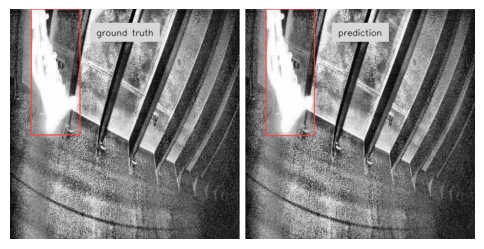

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


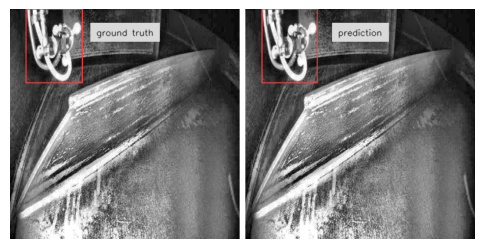

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


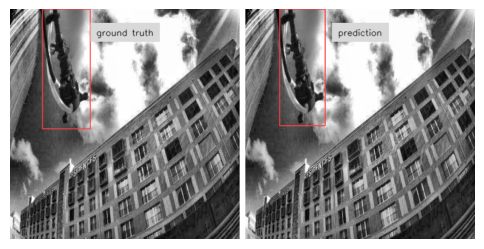

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


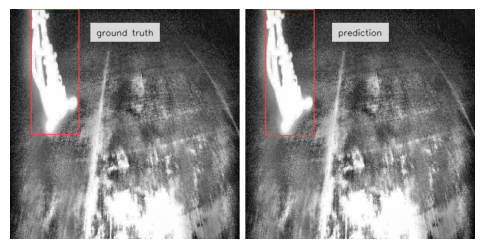

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.


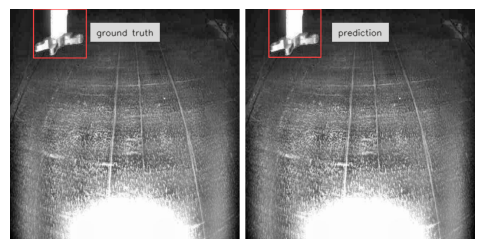

In [ ]:
IMAGE_COUNT = 5

for i in range(IMAGE_COUNT):
    path, sourece_image, annotations = ds_test[i]

    image = Image.open(path)
    inputs = processor(image, return_tensors="pt").to(DEVICE)

    with torch.no_grad():
        outputs = model(**inputs)

    w, h = image.size
    results = processor.post_process_object_detection(
        outputs, target_sizes=[(h, w)], threshold=0.3)

    detections = sv.Detections.from_transformers(results[0]).with_nms(threshold=0.1)

    annotated_images = [
        annotate(sourece_image, annotations, ds_train.classes),
        annotate(sourece_image, detections, ds_train.classes)
    ]
    grid = sv.create_tiles(
        annotated_images,
        titles=['ground truth', 'prediction'],
        titles_scale=0.5,
        single_tile_size=(400, 400),
        tile_padding_color=sv.Color.WHITE,
        tile_margin_color=sv.Color.WHITE
    )
    sv.plot_image(grid, size=(6, 6))

# Training YOLO-NAS

---
In this notebook, we cover:

- Install YOLO-NAS
  - Inference with pre-trained COCO model
  - Finding open source datasets
  - ⭐️ Training YOLO-NAS on your custom dataset ⭐️
  - Load trained model
  - Evaluate trained model
  - Inference with trained model

## 🔥 Let's begin!

##Train YOLO-NAS on Custom Dataset

This notebook is based on official [YOLO-NAS Notebook](https://colab.research.google.com/drive/1q0RmeVRzLwRXW-h9dPFSOchwJkThUy6d?usp=sharing) by DECI AI.

![YOLO-NAS on RF100](https://raw.githubusercontent.com/Deci-AI/super-gradients/master/documentation/source/images/yolo_nas_rf100.png)

## ⚡ Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [ ]:
!nvidia-smi

Wed Jan  8 13:17:10 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   57C    P0              29W /  70W |  10493MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

## Install YOLO-NAS


In [ ]:
!pip install -q roboflow==1.1.49
!pip install -q supervision==0.25.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.5/181.5 kB 10.4 MB/s eta 0:00:00


In [ ]:
# Pip errors are expected.
!pip install -q git+https://github.com/Deci-AI/super-gradients.git@stable
!sed -i -e "s/sghub.deci.ai/sg-hub-nv.s3.amazonaws.com/g" /usr/local/lib/python3.10/dist-packages/super_gradients/training/pretrained_models.py
!sed -i -e "s/sghub.deci.ai/sg-hub-nv.s3.amazonaws.com/g" /usr/local/lib/python3.10/dist-packages/super_gradients/training/utils/checkpoint_utils.py

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 684.5/684.5 kB 21.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.3/108.3 kB 9.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 913.9/913.9 kB 46.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 8.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 96.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 97.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 54.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━

### 🚨 Restart the runtime

**After installation is complete, you'll need to restart the runtime after installation completes. Navigate to `Runtime` -> `Restart runtime` and confirm by clicking `Yes` when you see the popup.**

After that, carry on with the notebook starting from the cell below 👇

**NOTE:** To make it easier for us to manage datasets, images and models we create a `HOME` constant.

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


## Inference with pre-trained COCO model

Start by instantiating a pretrained model. YOLO-NAS architecture comes in three different sizes: `yolo_nas_s`, `yolo_nas_m`, `and yolo_nas_l`. We will use `yolo_nas_l` throughout this notebook. Keep in mind that depending on your use-case your decision may be different. Take a peek at the diagram below visualizing the speed-accuracy tradeoff.

<br>

![YOLO-NAS](https://raw.githubusercontent.com/Deci-AI/super-gradients/master/documentation/source/images/yolo_nas_frontier.png)


In [ ]:
import torch

DEVICE = 'cuda' if torch.cuda.is_available() else "cpu"
MODEL_ARCH = 'yolo_nas_l'

In [ ]:
from super_gradients.training import models

model = models.get(MODEL_ARCH, pretrained_weights="coco").to(DEVICE)

The console stream is logged into /root/sg_logs/console.log


[2025-01-08 16:23:32] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it
[2025-01-08 16:23:41] INFO - utils.py - NumExpr defaulting to 2 threads.
[2025-01-08 16:23:49] INFO - env_sanity_check.py - Library check is not supported when super_gradients installed through "git+https://github.com/..." command
[2025-01-08 16:23:50] WARNING - checkpoint_utils.py - :warning: The pre-trained models provided by SuperGradients may have their own licenses or terms and conditions derived from the dataset used for pre-training.
 It is your responsibility to determine whether you have permission to use the models for your use case.
 The model you have requested was pre-trained on the coco dataset, published under the following terms: https://cocodataset.org/#termsofuse
[2025-01-08 16:23:50] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions 

## Downlod and load custom data set

In [ ]:
import os
HOME = os.getcwd()
print("HOME:", HOME)
from roboflow import Roboflow
from google.colab import userdata

ROBOFLOW_API_KEY = userdata.get('ROBOFLOW_API_KEY')
rf = Roboflow(api_key=ROBOFLOW_API_KEY)

project = rf.workspace("julien-xkm5o").project("probe-detection-fly")
version = project.version(1)
dataset = version.download("yolov5")


HOME: /content
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Probe-Detection-FLY-1 in yolov5pytorch::   0%|          | 0/1492 [00:00<?, ?it/s]

Extracting Dataset Version Zip to Probe-Detection-FLY-1 in yolov5pytorch::  37%|███▋      | 546/1492 [00:00<00:00, 2502.51it/s]

In [ ]:

LOCATION = dataset.location
print("location:", LOCATION)
CLASSES = sorted(project.classes.keys())
print("classes:", CLASSES)

## Fine-tune on custom dataset

`ckpt_root_dir` - this is the directory where results from all your experiments will be saved

`experiment_name` - all checkpoints, logs, and tensorboards will be saved in a directory with the name you specify here.

In [ ]:
MODEL_ARCH = 'yolo_nas_l'
BATCH_SIZE = 16
MAX_EPOCHS = 50
CHECKPOINT_DIR = f'{HOME}/checkpoints'
EXPERIMENT_NAME = project.name.lower().replace(" ", "_")

In [ ]:
from super_gradients.training import Trainer

trainer = Trainer(experiment_name=EXPERIMENT_NAME, ckpt_root_dir=CHECKPOINT_DIR)

Extracting Dataset Version Zip to Probe-Detection-FLY-1 in yolov5pytorch:: 100%|██████████| 1492/1492 [00:00<00:00, 3078.24it/s]


In [ ]:
dataset_params = {
    'data_dir': LOCATION,
    'train_images_dir':'train/images',
    'train_labels_dir':'train/labels',
    'val_images_dir':'valid/images',
    'val_labels_dir':'valid/labels',
    'test_images_dir':'test/images',
    'test_labels_dir':'test/labels',
    'classes': CLASSES
}

In [ ]:
from super_gradients.training.dataloaders.dataloaders import (
    coco_detection_yolo_format_train, coco_detection_yolo_format_val)

train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['train_images_dir'],
        'labels_dir': dataset_params['train_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['test_images_dir'],
        'labels_dir': dataset_params['test_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

location: /content/Probe-Detection-FLY-1
classes: ['Probe']


[2025-01-08 16:24:21] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 648/648 [00:00<00:00, 4651.68it/s]
[2025-01-08 16:24:22] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 61/61 [00:00<00:00, 3454.71it/s]
[2025-01-08 16:24:22] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.


:**NOTE:** Let's inspect our dataset

In [ ]:
train_data.dataset.transforms

### Instantiate the model

In [ ]:
from super_gradients.training import models

model = models.get(
    MODEL_ARCH,
    num_classes=len(dataset_params['classes']),
    pretrained_weights="coco"
)

[2025-01-08 16:26:27] WARNING - checkpoint_utils.py - :warning: The pre-trained models provided by SuperGradients may have their own licenses or terms and conditions derived from the dataset used for pre-training.
 It is your responsibility to determine whether you have permission to use the models for your use case.
 The model you have requested was pre-trained on the coco dataset, published under the following terms: https://cocodataset.org/#termsofuse
[2025-01-08 16:26:27] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
[2025-01-08 16:26:28] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_l


### Define metrics and training parameters

In [ ]:
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback

train_params = {
    'silent_mode': False,
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    "max_epochs": MAX_EPOCHS,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        num_classes=len(dataset_params['classes']),
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}

### Train the model

In [ ]:
trainer.train(
    model=model,
    training_params=train_params,
    train_loader=train_data,
    valid_loader=val_data
)

[2025-01-08 16:26:29] INFO - sg_trainer.py - Starting a new run with `run_id=RUN_20250108_162629_750033`
[2025-01-08 16:26:29] INFO - sg_trainer.py - Checkpoints directory: /content/checkpoints/probe_detection_fly/RUN_20250108_162629_750033
[2025-01-08 16:26:29] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}


The console stream is now moved to /content/checkpoints/probe_detection_fly/RUN_20250108_162629_750033/console_Jan08_16_26_29.txt


Object name `linear_epoch_step` is now deprecated. Please replace it with `LinearEpochLRWarmup`.
initialize_param_groups and update_param_groups usages are deprecated since 3.4.0, will be removed in 3.5.0 and have no effect. 
 Assign different learning rates by passing a mapping of layer name prefixes to lr values through initial_lr training hyperparameter (i.e initial_lr={'backbone': 0.01, 'default':0.1})
`torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
[2025-01-08 16:26:36] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Full dataset size:            647        (len(train_set))
    - Batch size per GPU:           16         (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             16         (num_gpus * batch_size)
    - Effective Batch 

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 2.2517
│   ├── Ppyoloeloss/loss_iou = 0.7023
│   ├── Ppyoloeloss/loss_dfl = 0.7912
│   └── Ppyoloeloss/loss = 3.7452
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.6174
    ├── Ppyoloeloss/loss_iou = 0.5321
    ├── Ppyoloeloss/loss_dfl = 0.7005
    ├── Ppyoloeloss/loss = 3.8499
    ├── Precision@0.50 = 0.0
    ├── Recall@0.50 = 0.0
    ├── Map@0.50 = 0.0002
    ├── F1@0.50 = 0.0
    └── Best_score_threshold = 0.02



Validating epoch 1: 100%|██████████| 4/4 [00:03<00:00,  1.02it/s]
[2025-01-08 16:28:57] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/probe_detection_fly/RUN_20250108_162629_750033/ckpt_best.pth
[2025-01-08 16:28:57] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6062037944793701


SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.3734
│   │   ├── Epoch N-1      = 2.2517 (↘ -0.8783)
│   │   └── Best until now = 2.2517 (↘ -0.8783)
│   ├── Ppyoloeloss/loss_iou = 0.5908
│   │   ├── Epoch N-1      = 0.7023 (↘ -0.1114)
│   │   └── Best until now = 0.7023 (↘ -0.1114)
│   ├── Ppyoloeloss/loss_dfl = 0.7165
│   │   ├── Epoch N-1      = 0.7912 (↘ -0.0747)
│   │   └── Best until now = 0.7912 (↘ -0.0747)
│   └── Ppyoloeloss/loss = 2.6808
│       ├── Epoch N-1      = 3.7452 (↘ -1.0645)
│       └── Best until now = 3.7452 (↘ -1.0645)
└── Validation
    ├── Ppyoloeloss/loss_cls = 16.2799
    │   ├── Epoch N-1      = 2.6174 (↗ 13.6626)
    │   └── Best until now = 2.6174 (↗ 13.6626)
    ├── Ppyoloeloss/loss_iou = 0.4151
    │   ├── Epoch N-1      = 0.5321 (↘ -0.117)
    │   └── Best until now = 0.5321 (↘ -0.117)
    ├── Ppyoloeloss/loss_dfl = 0.5924
    │   ├── Epoch N-1      = 0.7005 (↘ -0.1081)
    │   └── Best until now = 0.7005 (↘ -0.1081)
    ├── Ppyoloeloss/los

Validating epoch 2: 100%|██████████| 4/4 [00:03<00:00,  1.14it/s]
[2025-01-08 16:30:22] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/probe_detection_fly/RUN_20250108_162629_750033/ckpt_best.pth
[2025-01-08 16:30:22] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7468920350074768


SUMMARY OF EPOCH 2
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1935
│   │   ├── Epoch N-1      = 1.3734 (↘ -0.1798)
│   │   └── Best until now = 1.3734 (↘ -0.1798)
│   ├── Ppyoloeloss/loss_iou = 0.5704
│   │   ├── Epoch N-1      = 0.5908 (↘ -0.0204)
│   │   └── Best until now = 0.5908 (↘ -0.0204)
│   ├── Ppyoloeloss/loss_dfl = 0.6899
│   │   ├── Epoch N-1      = 0.7165 (↘ -0.0267)
│   │   └── Best until now = 0.7165 (↘ -0.0267)
│   └── Ppyoloeloss/loss = 2.4538
│       ├── Epoch N-1      = 2.6808 (↘ -0.2269)
│       └── Best until now = 2.6808 (↘ -0.2269)
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.1446
    │   ├── Epoch N-1      = 16.2799 (↘ -14.1353)
    │   └── Best until now = 2.6174 (↘ -0.4728)
    ├── Ppyoloeloss/loss_iou = 0.3608
    │   ├── Epoch N-1      = 0.4151 (↘ -0.0543)
    │   └── Best until now = 0.4151 (↘ -0.0543)
    ├── Ppyoloeloss/loss_dfl = 0.565
    │   ├── Epoch N-1      = 0.5924 (↘ -0.0273)
    │   └── Best until now = 0.5924 (↘ -0.0273)
    ├── Ppyoloeloss/l

Validating epoch 3: 100%|██████████| 4/4 [00:03<00:00,  1.15it/s]


SUMMARY OF EPOCH 3
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1736
│   │   ├── Epoch N-1      = 1.1935 (↘ -0.0199)
│   │   └── Best until now = 1.1935 (↘ -0.0199)
│   ├── Ppyoloeloss/loss_iou = 0.5965
│   │   ├── Epoch N-1      = 0.5704 (↗ 0.0261)
│   │   └── Best until now = 0.5704 (↗ 0.0261)
│   ├── Ppyoloeloss/loss_dfl = 0.7206
│   │   ├── Epoch N-1      = 0.6899 (↗ 0.0307)
│   │   └── Best until now = 0.6899 (↗ 0.0307)
│   └── Ppyoloeloss/loss = 2.4908
│       ├── Epoch N-1      = 2.4538 (↗ 0.0369)
│       └── Best until now = 2.4538 (↗ 0.0369)
└── Validation
    ├── Ppyoloeloss/loss_cls = 5.2559
    │   ├── Epoch N-1      = 2.1446 (↗ 3.1113)
    │   └── Best until now = 2.1446 (↗ 3.1113)
    ├── Ppyoloeloss/loss_iou = 0.4136
    │   ├── Epoch N-1      = 0.3608 (↗ 0.0528)
    │   └── Best until now = 0.3608 (↗ 0.0528)
    ├── Ppyoloeloss/loss_dfl = 0.6135
    │   ├── Epoch N-1      = 0.565  (↗ 0.0485)
    │   └── Best until now = 0.565  (↗ 0.0485)
    ├── Ppyoloeloss/loss = 6.2831


Validating epoch 4: 100%|██████████| 4/4 [00:04<00:00,  1.00s/it]


SUMMARY OF EPOCH 4
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1399
│   │   ├── Epoch N-1      = 1.1736 (↘ -0.0337)
│   │   └── Best until now = 1.1736 (↘ -0.0337)
│   ├── Ppyoloeloss/loss_iou = 0.5664
│   │   ├── Epoch N-1      = 0.5965 (↘ -0.0301)
│   │   └── Best until now = 0.5704 (↘ -0.004)
│   ├── Ppyoloeloss/loss_dfl = 0.6933
│   │   ├── Epoch N-1      = 0.7206 (↘ -0.0273)
│   │   └── Best until now = 0.6899 (↗ 0.0034)
│   └── Ppyoloeloss/loss = 2.3996
│       ├── Epoch N-1      = 2.4908 (↘ -0.0911)
│       └── Best until now = 2.4538 (↘ -0.0542)
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.4128
    │   ├── Epoch N-1      = 5.2559 (↘ -2.8431)
    │   └── Best until now = 2.1446 (↗ 0.2682)
    ├── Ppyoloeloss/loss_iou = 0.355
    │   ├── Epoch N-1      = 0.4136 (↘ -0.0586)
    │   └── Best until now = 0.3608 (↘ -0.0058)
    ├── Ppyoloeloss/loss_dfl = 0.5628
    │   ├── Epoch N-1      = 0.6135 (↘ -0.0508)
    │   └── Best until now = 0.565  (↘ -0.0023)
    ├── Ppyoloeloss/loss =

Validating epoch 5: 100%|██████████| 4/4 [00:04<00:00,  1.16s/it]


SUMMARY OF EPOCH 5
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1147
│   │   ├── Epoch N-1      = 1.1399 (↘ -0.0252)
│   │   └── Best until now = 1.1399 (↘ -0.0252)
│   ├── Ppyoloeloss/loss_iou = 0.5388
│   │   ├── Epoch N-1      = 0.5664 (↘ -0.0276)
│   │   └── Best until now = 0.5664 (↘ -0.0276)
│   ├── Ppyoloeloss/loss_dfl = 0.6748
│   │   ├── Epoch N-1      = 0.6933 (↘ -0.0185)
│   │   └── Best until now = 0.6899 (↘ -0.0151)
│   └── Ppyoloeloss/loss = 2.3282
│       ├── Epoch N-1      = 2.3996 (↘ -0.0714)
│       └── Best until now = 2.3996 (↘ -0.0714)
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.2148
    │   ├── Epoch N-1      = 2.4128 (↘ -0.1981)
    │   └── Best until now = 2.1446 (↗ 0.0702)
    ├── Ppyoloeloss/loss_iou = 0.3364
    │   ├── Epoch N-1      = 0.355  (↘ -0.0186)
    │   └── Best until now = 0.355  (↘ -0.0186)
    ├── Ppyoloeloss/loss_dfl = 0.5254
    │   ├── Epoch N-1      = 0.5628 (↘ -0.0373)
    │   └── Best until now = 0.5628 (↘ -0.0373)
    ├── Ppyoloeloss/los

Validating epoch 6: 100%|██████████| 4/4 [00:03<00:00,  1.15it/s]
[2025-01-08 16:35:29] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/probe_detection_fly/RUN_20250108_162629_750033/ckpt_best.pth
[2025-01-08 16:35:29] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7841511964797974


SUMMARY OF EPOCH 6
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1006
│   │   ├── Epoch N-1      = 1.1147 (↘ -0.0141)
│   │   └── Best until now = 1.1147 (↘ -0.0141)
│   ├── Ppyoloeloss/loss_iou = 0.5252
│   │   ├── Epoch N-1      = 0.5388 (↘ -0.0136)
│   │   └── Best until now = 0.5388 (↘ -0.0136)
│   ├── Ppyoloeloss/loss_dfl = 0.6724
│   │   ├── Epoch N-1      = 0.6748 (↘ -0.0024)
│   │   └── Best until now = 0.6748 (↘ -0.0024)
│   └── Ppyoloeloss/loss = 2.2982
│       ├── Epoch N-1      = 2.3282 (↘ -0.03)
│       └── Best until now = 2.3282 (↘ -0.03)
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.0873
    │   ├── Epoch N-1      = 2.2148 (↘ -0.1275)
    │   └── Best until now = 2.1446 (↘ -0.0573)
    ├── Ppyoloeloss/loss_iou = 0.3142
    │   ├── Epoch N-1      = 0.3364 (↘ -0.0222)
    │   └── Best until now = 0.3364 (↘ -0.0222)
    ├── Ppyoloeloss/loss_dfl = 0.5159
    │   ├── Epoch N-1      = 0.5254 (↘ -0.0096)
    │   └── Best until now = 0.5254 (↘ -0.0096)
    ├── Ppyoloeloss/loss =

Validating epoch 7: 100%|██████████| 4/4 [00:03<00:00,  1.17it/s]


SUMMARY OF EPOCH 7
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0552
│   │   ├── Epoch N-1      = 1.1006 (↘ -0.0454)
│   │   └── Best until now = 1.1006 (↘ -0.0454)
│   ├── Ppyoloeloss/loss_iou = 0.5078
│   │   ├── Epoch N-1      = 0.5252 (↘ -0.0174)
│   │   └── Best until now = 0.5252 (↘ -0.0174)
│   ├── Ppyoloeloss/loss_dfl = 0.6494
│   │   ├── Epoch N-1      = 0.6724 (↘ -0.023)
│   │   └── Best until now = 0.6724 (↘ -0.023)
│   └── Ppyoloeloss/loss = 2.2124
│       ├── Epoch N-1      = 2.2982 (↘ -0.0858)
│       └── Best until now = 2.2982 (↘ -0.0858)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.6493
    │   ├── Epoch N-1      = 2.0873 (↘ -0.4381)
    │   └── Best until now = 2.0873 (↘ -0.4381)
    ├── Ppyoloeloss/loss_iou = 0.3425
    │   ├── Epoch N-1      = 0.3142 (↗ 0.0283)
    │   └── Best until now = 0.3142 (↗ 0.0283)
    ├── Ppyoloeloss/loss_dfl = 0.5287
    │   ├── Epoch N-1      = 0.5159 (↗ 0.0129)
    │   └── Best until now = 0.5159 (↗ 0.0129)
    ├── Ppyoloeloss/loss = 2

Validating epoch 8: 100%|██████████| 4/4 [00:03<00:00,  1.14it/s]
[2025-01-08 16:40:49] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/probe_detection_fly/RUN_20250108_162629_750033/ckpt_best.pth
[2025-01-08 16:40:49] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.9479223489761353


SUMMARY OF EPOCH 8
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0781
│   │   ├── Epoch N-1      = 1.0552 (↗ 0.0229)
│   │   └── Best until now = 1.0552 (↗ 0.0229)
│   ├── Ppyoloeloss/loss_iou = 0.5083
│   │   ├── Epoch N-1      = 0.5078 (↗ 0.0005)
│   │   └── Best until now = 0.5078 (↗ 0.0005)
│   ├── Ppyoloeloss/loss_dfl = 0.649
│   │   ├── Epoch N-1      = 0.6494 (↘ -0.0004)
│   │   └── Best until now = 0.6494 (↘ -0.0004)
│   └── Ppyoloeloss/loss = 2.2355
│       ├── Epoch N-1      = 2.2124 (↗ 0.0231)
│       └── Best until now = 2.2124 (↗ 0.0231)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.4232
    │   ├── Epoch N-1      = 1.6493 (↘ -0.226)
    │   └── Best until now = 1.6493 (↘ -0.226)
    ├── Ppyoloeloss/loss_iou = 0.3366
    │   ├── Epoch N-1      = 0.3425 (↘ -0.0058)
    │   └── Best until now = 0.3142 (↗ 0.0225)
    ├── Ppyoloeloss/loss_dfl = 0.5287
    │   ├── Epoch N-1      = 0.5287 (↘ -1e-04)
    │   └── Best until now = 0.5159 (↗ 0.0128)
    ├── Ppyoloeloss/loss = 2.2886


Validating epoch 9: 100%|██████████| 4/4 [00:03<00:00,  1.12it/s]


SUMMARY OF EPOCH 9
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0523
│   │   ├── Epoch N-1      = 1.0781 (↘ -0.0259)
│   │   └── Best until now = 1.0552 (↘ -0.003)
│   ├── Ppyoloeloss/loss_iou = 0.5026
│   │   ├── Epoch N-1      = 0.5083 (↘ -0.0057)
│   │   └── Best until now = 0.5078 (↘ -0.0052)
│   ├── Ppyoloeloss/loss_dfl = 0.6506
│   │   ├── Epoch N-1      = 0.649  (↗ 0.0016)
│   │   └── Best until now = 0.649  (↗ 0.0016)
│   └── Ppyoloeloss/loss = 2.2055
│       ├── Epoch N-1      = 2.2355 (↘ -0.03)
│       └── Best until now = 2.2124 (↘ -0.0069)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0375
    │   ├── Epoch N-1      = 1.4232 (↘ -0.3857)
    │   └── Best until now = 1.4232 (↘ -0.3857)
    ├── Ppyoloeloss/loss_iou = 0.3356
    │   ├── Epoch N-1      = 0.3366 (↘ -0.001)
    │   └── Best until now = 0.3142 (↗ 0.0214)
    ├── Ppyoloeloss/loss_dfl = 0.5203
    │   ├── Epoch N-1      = 0.5287 (↘ -0.0084)
    │   └── Best until now = 0.5159 (↗ 0.0044)
    ├── Ppyoloeloss/loss = 1.8

Validating epoch 10: 100%|██████████| 4/4 [00:03<00:00,  1.15it/s]


SUMMARY OF EPOCH 10
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0564
│   │   ├── Epoch N-1      = 1.0523 (↗ 0.0041)
│   │   └── Best until now = 1.0523 (↗ 0.0041)
│   ├── Ppyoloeloss/loss_iou = 0.5004
│   │   ├── Epoch N-1      = 0.5026 (↘ -0.0022)
│   │   └── Best until now = 0.5026 (↘ -0.0022)
│   ├── Ppyoloeloss/loss_dfl = 0.6377
│   │   ├── Epoch N-1      = 0.6506 (↘ -0.013)
│   │   └── Best until now = 0.649  (↘ -0.0114)
│   └── Ppyoloeloss/loss = 2.1944
│       ├── Epoch N-1      = 2.2055 (↘ -0.0111)
│       └── Best until now = 2.2055 (↘ -0.0111)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9846
    │   ├── Epoch N-1      = 1.0375 (↘ -0.053)
    │   └── Best until now = 1.0375 (↘ -0.053)
    ├── Ppyoloeloss/loss_iou = 0.3047
    │   ├── Epoch N-1      = 0.3356 (↘ -0.031)
    │   └── Best until now = 0.3142 (↘ -0.0095)
    ├── Ppyoloeloss/loss_dfl = 0.4864
    │   ├── Epoch N-1      = 0.5203 (↘ -0.0338)
    │   └── Best until now = 0.5159 (↘ -0.0294)
    ├── Ppyoloeloss/loss = 

Validating epoch 11: 100%|██████████| 4/4 [00:04<00:00,  1.02s/it]


SUMMARY OF EPOCH 11
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0434
│   │   ├── Epoch N-1      = 1.0564 (↘ -0.0129)
│   │   └── Best until now = 1.0523 (↘ -0.0089)
│   ├── Ppyoloeloss/loss_iou = 0.5027
│   │   ├── Epoch N-1      = 0.5004 (↗ 0.0023)
│   │   └── Best until now = 0.5004 (↗ 0.0023)
│   ├── Ppyoloeloss/loss_dfl = 0.6334
│   │   ├── Epoch N-1      = 0.6377 (↘ -0.0043)
│   │   └── Best until now = 0.6377 (↘ -0.0043)
│   └── Ppyoloeloss/loss = 2.1795
│       ├── Epoch N-1      = 2.1944 (↘ -0.0149)
│       └── Best until now = 2.1944 (↘ -0.0149)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.2792
    │   ├── Epoch N-1      = 0.9846 (↗ 0.2947)
    │   └── Best until now = 0.9846 (↗ 0.2947)
    ├── Ppyoloeloss/loss_iou = 0.2853
    │   ├── Epoch N-1      = 0.3047 (↘ -0.0194)
    │   └── Best until now = 0.3047 (↘ -0.0194)
    ├── Ppyoloeloss/loss_dfl = 0.467
    │   ├── Epoch N-1      = 0.4864 (↘ -0.0195)
    │   └── Best until now = 0.4864 (↘ -0.0195)
    ├── Ppyoloeloss/loss =

Validating epoch 12: 100%|██████████| 4/4 [00:03<00:00,  1.03it/s]


SUMMARY OF EPOCH 12
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0056
│   │   ├── Epoch N-1      = 1.0434 (↘ -0.0378)
│   │   └── Best until now = 1.0434 (↘ -0.0378)
│   ├── Ppyoloeloss/loss_iou = 0.4969
│   │   ├── Epoch N-1      = 0.5027 (↘ -0.0058)
│   │   └── Best until now = 0.5004 (↘ -0.0034)
│   ├── Ppyoloeloss/loss_dfl = 0.6335
│   │   ├── Epoch N-1      = 0.6334 (↗ 1e-04)
│   │   └── Best until now = 0.6334 (↗ 1e-04)
│   └── Ppyoloeloss/loss = 2.136
│       ├── Epoch N-1      = 2.1795 (↘ -0.0435)
│       └── Best until now = 2.1795 (↘ -0.0435)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9905
    │   ├── Epoch N-1      = 1.2792 (↘ -0.2888)
    │   └── Best until now = 0.9846 (↗ 0.0059)
    ├── Ppyoloeloss/loss_iou = 0.2966
    │   ├── Epoch N-1      = 0.2853 (↗ 0.0113)
    │   └── Best until now = 0.2853 (↗ 0.0113)
    ├── Ppyoloeloss/loss_dfl = 0.489
    │   ├── Epoch N-1      = 0.467  (↗ 0.022)
    │   └── Best until now = 0.467  (↗ 0.022)
    ├── Ppyoloeloss/loss = 1.776
 

Validating epoch 13: 100%|██████████| 4/4 [00:03<00:00,  1.16it/s]


SUMMARY OF EPOCH 13
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0119
│   │   ├── Epoch N-1      = 1.0056 (↗ 0.0063)
│   │   └── Best until now = 1.0056 (↗ 0.0063)
│   ├── Ppyoloeloss/loss_iou = 0.4839
│   │   ├── Epoch N-1      = 0.4969 (↘ -0.013)
│   │   └── Best until now = 0.4969 (↘ -0.013)
│   ├── Ppyoloeloss/loss_dfl = 0.6234
│   │   ├── Epoch N-1      = 0.6335 (↘ -0.0101)
│   │   └── Best until now = 0.6334 (↘ -0.01)
│   └── Ppyoloeloss/loss = 2.1192
│       ├── Epoch N-1      = 2.136  (↘ -0.0168)
│       └── Best until now = 2.136  (↘ -0.0168)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.708
    │   ├── Epoch N-1      = 0.9905 (↗ 0.7175)
    │   └── Best until now = 0.9846 (↗ 0.7234)
    ├── Ppyoloeloss/loss_iou = 0.2807
    │   ├── Epoch N-1      = 0.2966 (↘ -0.0159)
    │   └── Best until now = 0.2853 (↘ -0.0046)
    ├── Ppyoloeloss/loss_dfl = 0.465
    │   ├── Epoch N-1      = 0.489  (↘ -0.024)
    │   └── Best until now = 0.467  (↘ -0.002)
    ├── Ppyoloeloss/loss = 2.4536

Validating epoch 14: 100%|██████████| 4/4 [00:03<00:00,  1.16it/s]


SUMMARY OF EPOCH 14
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9954
│   │   ├── Epoch N-1      = 1.0119 (↘ -0.0164)
│   │   └── Best until now = 1.0056 (↘ -0.0102)
│   ├── Ppyoloeloss/loss_iou = 0.4768
│   │   ├── Epoch N-1      = 0.4839 (↘ -0.0071)
│   │   └── Best until now = 0.4839 (↘ -0.0071)
│   ├── Ppyoloeloss/loss_dfl = 0.621
│   │   ├── Epoch N-1      = 0.6234 (↘ -0.0024)
│   │   └── Best until now = 0.6234 (↘ -0.0024)
│   └── Ppyoloeloss/loss = 2.0932
│       ├── Epoch N-1      = 2.1192 (↘ -0.026)
│       └── Best until now = 2.1192 (↘ -0.026)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9316
    │   ├── Epoch N-1      = 1.708  (↘ -0.7764)
    │   └── Best until now = 0.9846 (↘ -0.053)
    ├── Ppyoloeloss/loss_iou = 0.2713
    │   ├── Epoch N-1      = 0.2807 (↘ -0.0094)
    │   └── Best until now = 0.2807 (↘ -0.0094)
    ├── Ppyoloeloss/loss_dfl = 0.4673
    │   ├── Epoch N-1      = 0.465  (↗ 0.0023)
    │   └── Best until now = 0.465  (↗ 0.0023)
    ├── Ppyoloeloss/loss = 

Validating epoch 15: 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]


SUMMARY OF EPOCH 15
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9796
│   │   ├── Epoch N-1      = 0.9954 (↘ -0.0158)
│   │   └── Best until now = 0.9954 (↘ -0.0158)
│   ├── Ppyoloeloss/loss_iou = 0.4679
│   │   ├── Epoch N-1      = 0.4768 (↘ -0.0089)
│   │   └── Best until now = 0.4768 (↘ -0.0089)
│   ├── Ppyoloeloss/loss_dfl = 0.6066
│   │   ├── Epoch N-1      = 0.621  (↘ -0.0144)
│   │   └── Best until now = 0.621  (↘ -0.0144)
│   └── Ppyoloeloss/loss = 2.0542
│       ├── Epoch N-1      = 2.0932 (↘ -0.039)
│       └── Best until now = 2.0932 (↘ -0.039)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8742
    │   ├── Epoch N-1      = 0.9316 (↘ -0.0574)
    │   └── Best until now = 0.9316 (↘ -0.0574)
    ├── Ppyoloeloss/loss_iou = 0.2981
    │   ├── Epoch N-1      = 0.2713 (↗ 0.0269)
    │   └── Best until now = 0.2713 (↗ 0.0269)
    ├── Ppyoloeloss/loss_dfl = 0.4757
    │   ├── Epoch N-1      = 0.4673 (↗ 0.0084)
    │   └── Best until now = 0.465  (↗ 0.0107)
    ├── Ppyoloeloss/loss = 

Validating epoch 16: 100%|██████████| 4/4 [00:04<00:00,  1.04s/it]


SUMMARY OF EPOCH 16
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9888
│   │   ├── Epoch N-1      = 0.9796 (↗ 0.0092)
│   │   └── Best until now = 0.9796 (↗ 0.0092)
│   ├── Ppyoloeloss/loss_iou = 0.4624
│   │   ├── Epoch N-1      = 0.4679 (↘ -0.0056)
│   │   └── Best until now = 0.4679 (↘ -0.0056)
│   ├── Ppyoloeloss/loss_dfl = 0.5981
│   │   ├── Epoch N-1      = 0.6066 (↘ -0.0085)
│   │   └── Best until now = 0.6066 (↘ -0.0085)
│   └── Ppyoloeloss/loss = 2.0492
│       ├── Epoch N-1      = 2.0542 (↘ -0.0049)
│       └── Best until now = 2.0542 (↘ -0.0049)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8822
    │   ├── Epoch N-1      = 0.8742 (↗ 0.008)
    │   └── Best until now = 0.8742 (↗ 0.008)
    ├── Ppyoloeloss/loss_iou = 0.3027
    │   ├── Epoch N-1      = 0.2981 (↗ 0.0045)
    │   └── Best until now = 0.2713 (↗ 0.0314)
    ├── Ppyoloeloss/loss_dfl = 0.4876
    │   ├── Epoch N-1      = 0.4757 (↗ 0.0119)
    │   └── Best until now = 0.465  (↗ 0.0226)
    ├── Ppyoloeloss/loss = 1.67

Validating epoch 17: 100%|██████████| 4/4 [00:03<00:00,  1.14it/s]
[2025-01-08 17:05:24] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/probe_detection_fly/RUN_20250108_162629_750033/ckpt_best.pth
[2025-01-08 17:05:24] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.9566677808761597


SUMMARY OF EPOCH 17
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9739
│   │   ├── Epoch N-1      = 0.9888 (↘ -0.0149)
│   │   └── Best until now = 0.9796 (↘ -0.0057)
│   ├── Ppyoloeloss/loss_iou = 0.4588
│   │   ├── Epoch N-1      = 0.4624 (↘ -0.0035)
│   │   └── Best until now = 0.4624 (↘ -0.0035)
│   ├── Ppyoloeloss/loss_dfl = 0.6006
│   │   ├── Epoch N-1      = 0.5981 (↗ 0.0025)
│   │   └── Best until now = 0.5981 (↗ 0.0025)
│   └── Ppyoloeloss/loss = 2.0333
│       ├── Epoch N-1      = 2.0492 (↘ -0.0159)
│       └── Best until now = 2.0492 (↘ -0.0159)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9029
    │   ├── Epoch N-1      = 0.8822 (↗ 0.0207)
    │   └── Best until now = 0.8742 (↗ 0.0287)
    ├── Ppyoloeloss/loss_iou = 0.2601
    │   ├── Epoch N-1      = 0.3027 (↘ -0.0426)
    │   └── Best until now = 0.2713 (↘ -0.0112)
    ├── Ppyoloeloss/loss_dfl = 0.4522
    │   ├── Epoch N-1      = 0.4876 (↘ -0.0354)
    │   └── Best until now = 0.465  (↘ -0.0128)
    ├── Ppyoloeloss/loss 

Validating epoch 18: 100%|██████████| 4/4 [00:03<00:00,  1.15it/s]


SUMMARY OF EPOCH 18
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9676
│   │   ├── Epoch N-1      = 0.9739 (↘ -0.0063)
│   │   └── Best until now = 0.9739 (↘ -0.0063)
│   ├── Ppyoloeloss/loss_iou = 0.4626
│   │   ├── Epoch N-1      = 0.4588 (↗ 0.0038)
│   │   └── Best until now = 0.4588 (↗ 0.0038)
│   ├── Ppyoloeloss/loss_dfl = 0.6025
│   │   ├── Epoch N-1      = 0.6006 (↗ 0.0019)
│   │   └── Best until now = 0.5981 (↗ 0.0044)
│   └── Ppyoloeloss/loss = 2.0327
│       ├── Epoch N-1      = 2.0333 (↘ -0.0006)
│       └── Best until now = 2.0333 (↘ -0.0006)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9403
    │   ├── Epoch N-1      = 0.9029 (↗ 0.0374)
    │   └── Best until now = 0.8742 (↗ 0.0661)
    ├── Ppyoloeloss/loss_iou = 0.2791
    │   ├── Epoch N-1      = 0.2601 (↗ 0.019)
    │   └── Best until now = 0.2601 (↗ 0.019)
    ├── Ppyoloeloss/loss_dfl = 0.4742
    │   ├── Epoch N-1      = 0.4522 (↗ 0.022)
    │   └── Best until now = 0.4522 (↗ 0.022)
    ├── Ppyoloeloss/loss = 1.6935
 

Validating epoch 19: 100%|██████████| 4/4 [00:04<00:00,  1.10s/it]
[2025-01-08 17:11:09] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/probe_detection_fly/RUN_20250108_162629_750033/ckpt_best.pth
[2025-01-08 17:11:09] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.9686008095741272


SUMMARY OF EPOCH 19
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9408
│   │   ├── Epoch N-1      = 0.9676 (↘ -0.0268)
│   │   └── Best until now = 0.9676 (↘ -0.0268)
│   ├── Ppyoloeloss/loss_iou = 0.4514
│   │   ├── Epoch N-1      = 0.4626 (↘ -0.0113)
│   │   └── Best until now = 0.4588 (↘ -0.0075)
│   ├── Ppyoloeloss/loss_dfl = 0.5851
│   │   ├── Epoch N-1      = 0.6025 (↘ -0.0173)
│   │   └── Best until now = 0.5981 (↘ -0.0129)
│   └── Ppyoloeloss/loss = 1.9773
│       ├── Epoch N-1      = 2.0327 (↘ -0.0554)
│       └── Best until now = 2.0327 (↘ -0.0554)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7777
    │   ├── Epoch N-1      = 0.9403 (↘ -0.1626)
    │   └── Best until now = 0.8742 (↘ -0.0965)
    ├── Ppyoloeloss/loss_iou = 0.2738
    │   ├── Epoch N-1      = 0.2791 (↘ -0.0053)
    │   └── Best until now = 0.2601 (↗ 0.0137)
    ├── Ppyoloeloss/loss_dfl = 0.4612
    │   ├── Epoch N-1      = 0.4742 (↘ -0.013)
    │   └── Best until now = 0.4522 (↗ 0.009)
    ├── Ppyoloeloss/loss 

Validating epoch 20: 100%|██████████| 4/4 [00:03<00:00,  1.16it/s]


SUMMARY OF EPOCH 20
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9485
│   │   ├── Epoch N-1      = 0.9408 (↗ 0.0077)
│   │   └── Best until now = 0.9408 (↗ 0.0077)
│   ├── Ppyoloeloss/loss_iou = 0.4535
│   │   ├── Epoch N-1      = 0.4514 (↗ 0.0021)
│   │   └── Best until now = 0.4514 (↗ 0.0021)
│   ├── Ppyoloeloss/loss_dfl = 0.5947
│   │   ├── Epoch N-1      = 0.5851 (↗ 0.0095)
│   │   └── Best until now = 0.5851 (↗ 0.0095)
│   └── Ppyoloeloss/loss = 1.9966
│       ├── Epoch N-1      = 1.9773 (↗ 0.0194)
│       └── Best until now = 1.9773 (↗ 0.0194)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7943
    │   ├── Epoch N-1      = 0.7777 (↗ 0.0166)
    │   └── Best until now = 0.7777 (↗ 0.0166)
    ├── Ppyoloeloss/loss_iou = 0.2707
    │   ├── Epoch N-1      = 0.2738 (↘ -0.0031)
    │   └── Best until now = 0.2601 (↗ 0.0106)
    ├── Ppyoloeloss/loss_dfl = 0.4574
    │   ├── Epoch N-1      = 0.4612 (↘ -0.0038)
    │   └── Best until now = 0.4522 (↗ 0.0052)
    ├── Ppyoloeloss/loss = 1.5223

Validating epoch 21: 100%|██████████| 4/4 [00:04<00:00,  1.05s/it]


SUMMARY OF EPOCH 21
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9547
│   │   ├── Epoch N-1      = 0.9485 (↗ 0.0062)
│   │   └── Best until now = 0.9408 (↗ 0.014)
│   ├── Ppyoloeloss/loss_iou = 0.45
│   │   ├── Epoch N-1      = 0.4535 (↘ -0.0034)
│   │   └── Best until now = 0.4514 (↘ -0.0013)
│   ├── Ppyoloeloss/loss_dfl = 0.5945
│   │   ├── Epoch N-1      = 0.5947 (↘ -1e-04)
│   │   └── Best until now = 0.5851 (↗ 0.0094)
│   └── Ppyoloeloss/loss = 1.9993
│       ├── Epoch N-1      = 1.9966 (↗ 0.0027)
│       └── Best until now = 1.9773 (↗ 0.022)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8301
    │   ├── Epoch N-1      = 0.7943 (↗ 0.0359)
    │   └── Best until now = 0.7777 (↗ 0.0525)
    ├── Ppyoloeloss/loss_iou = 0.2533
    │   ├── Epoch N-1      = 0.2707 (↘ -0.0174)
    │   └── Best until now = 0.2601 (↘ -0.0068)
    ├── Ppyoloeloss/loss_dfl = 0.4474
    │   ├── Epoch N-1      = 0.4574 (↘ -0.01)
    │   └── Best until now = 0.4522 (↘ -0.0048)
    ├── Ppyoloeloss/loss = 1.5309
 

Validating epoch 22: 100%|██████████| 4/4 [00:04<00:00,  1.06s/it]


SUMMARY OF EPOCH 22
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9329
│   │   ├── Epoch N-1      = 0.9547 (↘ -0.0218)
│   │   └── Best until now = 0.9408 (↘ -0.0079)
│   ├── Ppyoloeloss/loss_iou = 0.4483
│   │   ├── Epoch N-1      = 0.45   (↘ -0.0017)
│   │   └── Best until now = 0.45   (↘ -0.0017)
│   ├── Ppyoloeloss/loss_dfl = 0.5833
│   │   ├── Epoch N-1      = 0.5945 (↘ -0.0113)
│   │   └── Best until now = 0.5851 (↘ -0.0019)
│   └── Ppyoloeloss/loss = 1.9645
│       ├── Epoch N-1      = 1.9993 (↘ -0.0348)
│       └── Best until now = 1.9773 (↘ -0.0128)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0015
    │   ├── Epoch N-1      = 0.8301 (↗ 0.1714)
    │   └── Best until now = 0.7777 (↗ 0.2239)
    ├── Ppyoloeloss/loss_iou = 0.2632
    │   ├── Epoch N-1      = 0.2533 (↗ 0.0099)
    │   └── Best until now = 0.2533 (↗ 0.0099)
    ├── Ppyoloeloss/loss_dfl = 0.4555
    │   ├── Epoch N-1      = 0.4474 (↗ 0.0081)
    │   └── Best until now = 0.4474 (↗ 0.0081)
    ├── Ppyoloeloss/loss = 

Validating epoch 23: 100%|██████████| 4/4 [00:04<00:00,  1.06s/it]


SUMMARY OF EPOCH 23
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9253
│   │   ├── Epoch N-1      = 0.9329 (↘ -0.0076)
│   │   └── Best until now = 0.9329 (↘ -0.0076)
│   ├── Ppyoloeloss/loss_iou = 0.4434
│   │   ├── Epoch N-1      = 0.4483 (↘ -0.0049)
│   │   └── Best until now = 0.4483 (↘ -0.0049)
│   ├── Ppyoloeloss/loss_dfl = 0.5775
│   │   ├── Epoch N-1      = 0.5833 (↘ -0.0058)
│   │   └── Best until now = 0.5833 (↘ -0.0058)
│   └── Ppyoloeloss/loss = 1.9462
│       ├── Epoch N-1      = 1.9645 (↘ -0.0183)
│       └── Best until now = 1.9645 (↘ -0.0183)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7785
    │   ├── Epoch N-1      = 1.0015 (↘ -0.223)
    │   └── Best until now = 0.7777 (↗ 0.0009)
    ├── Ppyoloeloss/loss_iou = 0.2505
    │   ├── Epoch N-1      = 0.2632 (↘ -0.0127)
    │   └── Best until now = 0.2533 (↘ -0.0028)
    ├── Ppyoloeloss/loss_dfl = 0.4576
    │   ├── Epoch N-1      = 0.4555 (↗ 0.0021)
    │   └── Best until now = 0.4474 (↗ 0.0102)
    ├── Ppyoloeloss/loss 

Validating epoch 24: 100%|██████████| 4/4 [00:03<00:00,  1.16it/s]


SUMMARY OF EPOCH 24
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.902
│   │   ├── Epoch N-1      = 0.9253 (↘ -0.0233)
│   │   └── Best until now = 0.9253 (↘ -0.0233)
│   ├── Ppyoloeloss/loss_iou = 0.4239
│   │   ├── Epoch N-1      = 0.4434 (↘ -0.0195)
│   │   └── Best until now = 0.4434 (↘ -0.0195)
│   ├── Ppyoloeloss/loss_dfl = 0.5667
│   │   ├── Epoch N-1      = 0.5775 (↘ -0.0108)
│   │   └── Best until now = 0.5775 (↘ -0.0108)
│   └── Ppyoloeloss/loss = 1.8927
│       ├── Epoch N-1      = 1.9462 (↘ -0.0535)
│       └── Best until now = 1.9462 (↘ -0.0535)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8038
    │   ├── Epoch N-1      = 0.7785 (↗ 0.0253)
    │   └── Best until now = 0.7777 (↗ 0.0262)
    ├── Ppyoloeloss/loss_iou = 0.229
    │   ├── Epoch N-1      = 0.2505 (↘ -0.0215)
    │   └── Best until now = 0.2505 (↘ -0.0215)
    ├── Ppyoloeloss/loss_dfl = 0.4295
    │   ├── Epoch N-1      = 0.4576 (↘ -0.0281)
    │   └── Best until now = 0.4474 (↘ -0.0179)
    ├── Ppyoloeloss/loss 

Validating epoch 25: 100%|██████████| 4/4 [00:04<00:00,  1.02s/it]


SUMMARY OF EPOCH 25
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8991
│   │   ├── Epoch N-1      = 0.902  (↘ -0.003)
│   │   └── Best until now = 0.902  (↘ -0.003)
│   ├── Ppyoloeloss/loss_iou = 0.4241
│   │   ├── Epoch N-1      = 0.4239 (↗ 1e-04)
│   │   └── Best until now = 0.4239 (↗ 1e-04)
│   ├── Ppyoloeloss/loss_dfl = 0.5592
│   │   ├── Epoch N-1      = 0.5667 (↘ -0.0075)
│   │   └── Best until now = 0.5667 (↘ -0.0075)
│   └── Ppyoloeloss/loss = 1.8824
│       ├── Epoch N-1      = 1.8927 (↘ -0.0103)
│       └── Best until now = 1.8927 (↘ -0.0103)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9335
    │   ├── Epoch N-1      = 0.8038 (↗ 0.1296)
    │   └── Best until now = 0.7777 (↗ 0.1558)
    ├── Ppyoloeloss/loss_iou = 0.2155
    │   ├── Epoch N-1      = 0.229  (↘ -0.0135)
    │   └── Best until now = 0.229  (↘ -0.0135)
    ├── Ppyoloeloss/loss_dfl = 0.4226
    │   ├── Epoch N-1      = 0.4295 (↘ -0.0069)
    │   └── Best until now = 0.4295 (↘ -0.0069)
    ├── Ppyoloeloss/loss = 1.

Validating epoch 26: 100%|██████████| 4/4 [00:03<00:00,  1.01it/s]


SUMMARY OF EPOCH 26
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8901
│   │   ├── Epoch N-1      = 0.8991 (↘ -0.009)
│   │   └── Best until now = 0.8991 (↘ -0.009)
│   ├── Ppyoloeloss/loss_iou = 0.4252
│   │   ├── Epoch N-1      = 0.4241 (↗ 0.0011)
│   │   └── Best until now = 0.4239 (↗ 0.0012)
│   ├── Ppyoloeloss/loss_dfl = 0.5666
│   │   ├── Epoch N-1      = 0.5592 (↗ 0.0073)
│   │   └── Best until now = 0.5592 (↗ 0.0073)
│   └── Ppyoloeloss/loss = 1.8818
│       ├── Epoch N-1      = 1.8824 (↘ -0.0005)
│       └── Best until now = 1.8824 (↘ -0.0005)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7733
    │   ├── Epoch N-1      = 0.9335 (↘ -0.1601)
    │   └── Best until now = 0.7777 (↘ -0.0043)
    ├── Ppyoloeloss/loss_iou = 0.2389
    │   ├── Epoch N-1      = 0.2155 (↗ 0.0234)
    │   └── Best until now = 0.2155 (↗ 0.0234)
    ├── Ppyoloeloss/loss_dfl = 0.4309
    │   ├── Epoch N-1      = 0.4226 (↗ 0.0082)
    │   └── Best until now = 0.4226 (↗ 0.0082)
    ├── Ppyoloeloss/loss = 1.44

Validating epoch 27: 100%|██████████| 4/4 [00:03<00:00,  1.17it/s]
[2025-01-08 17:33:25] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/probe_detection_fly/RUN_20250108_162629_750033/ckpt_best.pth
[2025-01-08 17:33:25] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.9764547944068909


SUMMARY OF EPOCH 27
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8793
│   │   ├── Epoch N-1      = 0.8901 (↘ -0.0107)
│   │   └── Best until now = 0.8901 (↘ -0.0107)
│   ├── Ppyoloeloss/loss_iou = 0.4134
│   │   ├── Epoch N-1      = 0.4252 (↘ -0.0118)
│   │   └── Best until now = 0.4239 (↘ -0.0105)
│   ├── Ppyoloeloss/loss_dfl = 0.5505
│   │   ├── Epoch N-1      = 0.5666 (↘ -0.0161)
│   │   └── Best until now = 0.5592 (↘ -0.0087)
│   └── Ppyoloeloss/loss = 1.8433
│       ├── Epoch N-1      = 1.8818 (↘ -0.0386)
│       └── Best until now = 1.8818 (↘ -0.0386)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8432
    │   ├── Epoch N-1      = 0.7733 (↗ 0.0699)
    │   └── Best until now = 0.7733 (↗ 0.0699)
    ├── Ppyoloeloss/loss_iou = 0.2779
    │   ├── Epoch N-1      = 0.2389 (↗ 0.039)
    │   └── Best until now = 0.2155 (↗ 0.0624)
    ├── Ppyoloeloss/loss_dfl = 0.4654
    │   ├── Epoch N-1      = 0.4309 (↗ 0.0346)
    │   └── Best until now = 0.4226 (↗ 0.0428)
    ├── Ppyoloeloss/loss = 1

Validating epoch 28: 100%|██████████| 4/4 [00:04<00:00,  1.03s/it]


SUMMARY OF EPOCH 28
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8957
│   │   ├── Epoch N-1      = 0.8793 (↗ 0.0164)
│   │   └── Best until now = 0.8793 (↗ 0.0164)
│   ├── Ppyoloeloss/loss_iou = 0.4135
│   │   ├── Epoch N-1      = 0.4134 (↗ 1e-04)
│   │   └── Best until now = 0.4134 (↗ 1e-04)
│   ├── Ppyoloeloss/loss_dfl = 0.5556
│   │   ├── Epoch N-1      = 0.5505 (↗ 0.0051)
│   │   └── Best until now = 0.5505 (↗ 0.0051)
│   └── Ppyoloeloss/loss = 1.8648
│       ├── Epoch N-1      = 1.8433 (↗ 0.0216)
│       └── Best until now = 1.8433 (↗ 0.0216)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7385
    │   ├── Epoch N-1      = 0.8432 (↘ -0.1048)
    │   └── Best until now = 0.7733 (↘ -0.0348)
    ├── Ppyoloeloss/loss_iou = 0.2541
    │   ├── Epoch N-1      = 0.2779 (↘ -0.0239)
    │   └── Best until now = 0.2155 (↗ 0.0386)
    ├── Ppyoloeloss/loss_dfl = 0.4483
    │   ├── Epoch N-1      = 0.4654 (↘ -0.0171)
    │   └── Best until now = 0.4226 (↗ 0.0256)
    ├── Ppyoloeloss/loss = 1.4408

Validating epoch 29: 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]


SUMMARY OF EPOCH 29
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8896
│   │   ├── Epoch N-1      = 0.8957 (↘ -0.0062)
│   │   └── Best until now = 0.8793 (↗ 0.0102)
│   ├── Ppyoloeloss/loss_iou = 0.4076
│   │   ├── Epoch N-1      = 0.4135 (↘ -0.0058)
│   │   └── Best until now = 0.4134 (↘ -0.0058)
│   ├── Ppyoloeloss/loss_dfl = 0.5481
│   │   ├── Epoch N-1      = 0.5556 (↘ -0.0075)
│   │   └── Best until now = 0.5505 (↘ -0.0024)
│   └── Ppyoloeloss/loss = 1.8454
│       ├── Epoch N-1      = 1.8648 (↘ -0.0195)
│       └── Best until now = 1.8433 (↗ 0.0021)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9474
    │   ├── Epoch N-1      = 0.7385 (↗ 0.2089)
    │   └── Best until now = 0.7385 (↗ 0.2089)
    ├── Ppyoloeloss/loss_iou = 0.2523
    │   ├── Epoch N-1      = 0.2541 (↘ -0.0018)
    │   └── Best until now = 0.2155 (↗ 0.0368)
    ├── Ppyoloeloss/loss_dfl = 0.4477
    │   ├── Epoch N-1      = 0.4483 (↘ -0.0006)
    │   └── Best until now = 0.4226 (↗ 0.025)
    ├── Ppyoloeloss/loss = 1

Validating epoch 30: 100%|██████████| 4/4 [00:03<00:00,  1.11it/s]


SUMMARY OF EPOCH 30
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8837
│   │   ├── Epoch N-1      = 0.8896 (↘ -0.0058)
│   │   └── Best until now = 0.8793 (↗ 0.0044)
│   ├── Ppyoloeloss/loss_iou = 0.407
│   │   ├── Epoch N-1      = 0.4076 (↘ -0.0006)
│   │   └── Best until now = 0.4076 (↘ -0.0006)
│   ├── Ppyoloeloss/loss_dfl = 0.5541
│   │   ├── Epoch N-1      = 0.5481 (↗ 0.0059)
│   │   └── Best until now = 0.5481 (↗ 0.0059)
│   └── Ppyoloeloss/loss = 1.8448
│       ├── Epoch N-1      = 1.8454 (↘ -0.0005)
│       └── Best until now = 1.8433 (↗ 0.0016)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7377
    │   ├── Epoch N-1      = 0.9474 (↘ -0.2097)
    │   └── Best until now = 0.7385 (↘ -0.0007)
    ├── Ppyoloeloss/loss_iou = 0.218
    │   ├── Epoch N-1      = 0.2523 (↘ -0.0343)
    │   └── Best until now = 0.2155 (↗ 0.0025)
    ├── Ppyoloeloss/loss_dfl = 0.4137
    │   ├── Epoch N-1      = 0.4477 (↘ -0.034)
    │   └── Best until now = 0.4226 (↘ -0.009)
    ├── Ppyoloeloss/loss = 1.3

Validating epoch 31: 100%|██████████| 4/4 [00:04<00:00,  1.06s/it]


SUMMARY OF EPOCH 31
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8861
│   │   ├── Epoch N-1      = 0.8837 (↗ 0.0024)
│   │   └── Best until now = 0.8793 (↗ 0.0068)
│   ├── Ppyoloeloss/loss_iou = 0.4045
│   │   ├── Epoch N-1      = 0.407  (↘ -0.0025)
│   │   └── Best until now = 0.407  (↘ -0.0025)
│   ├── Ppyoloeloss/loss_dfl = 0.5482
│   │   ├── Epoch N-1      = 0.5541 (↘ -0.0059)
│   │   └── Best until now = 0.5481 (↗ 0.0)
│   └── Ppyoloeloss/loss = 1.8388
│       ├── Epoch N-1      = 1.8448 (↘ -0.006)
│       └── Best until now = 1.8433 (↘ -0.0044)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.892
    │   ├── Epoch N-1      = 0.7377 (↗ 0.1543)
    │   └── Best until now = 0.7377 (↗ 0.1543)
    ├── Ppyoloeloss/loss_iou = 0.2392
    │   ├── Epoch N-1      = 0.218  (↗ 0.0212)
    │   └── Best until now = 0.2155 (↗ 0.0237)
    ├── Ppyoloeloss/loss_dfl = 0.4323
    │   ├── Epoch N-1      = 0.4137 (↗ 0.0187)
    │   └── Best until now = 0.4137 (↗ 0.0187)
    ├── Ppyoloeloss/loss = 1.5635
 

Validating epoch 32: 100%|██████████| 4/4 [00:03<00:00,  1.04it/s]


SUMMARY OF EPOCH 32
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8556
│   │   ├── Epoch N-1      = 0.8861 (↘ -0.0306)
│   │   └── Best until now = 0.8793 (↘ -0.0238)
│   ├── Ppyoloeloss/loss_iou = 0.3961
│   │   ├── Epoch N-1      = 0.4045 (↘ -0.0084)
│   │   └── Best until now = 0.4045 (↘ -0.0084)
│   ├── Ppyoloeloss/loss_dfl = 0.5344
│   │   ├── Epoch N-1      = 0.5482 (↘ -0.0138)
│   │   └── Best until now = 0.5481 (↘ -0.0137)
│   └── Ppyoloeloss/loss = 1.7861
│       ├── Epoch N-1      = 1.8388 (↘ -0.0527)
│       └── Best until now = 1.8388 (↘ -0.0527)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.706
    │   ├── Epoch N-1      = 0.892  (↘ -0.1861)
    │   └── Best until now = 0.7377 (↘ -0.0318)
    ├── Ppyoloeloss/loss_iou = 0.2352
    │   ├── Epoch N-1      = 0.2392 (↘ -0.004)
    │   └── Best until now = 0.2155 (↗ 0.0197)
    ├── Ppyoloeloss/loss_dfl = 0.4196
    │   ├── Epoch N-1      = 0.4323 (↘ -0.0127)
    │   └── Best until now = 0.4137 (↗ 0.006)
    ├── Ppyoloeloss/loss =

Validating epoch 33: 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]


SUMMARY OF EPOCH 33
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8423
│   │   ├── Epoch N-1      = 0.8556 (↘ -0.0133)
│   │   └── Best until now = 0.8556 (↘ -0.0133)
│   ├── Ppyoloeloss/loss_iou = 0.3993
│   │   ├── Epoch N-1      = 0.3961 (↗ 0.0032)
│   │   └── Best until now = 0.3961 (↗ 0.0032)
│   ├── Ppyoloeloss/loss_dfl = 0.5385
│   │   ├── Epoch N-1      = 0.5344 (↗ 0.0041)
│   │   └── Best until now = 0.5344 (↗ 0.0041)
│   └── Ppyoloeloss/loss = 1.7801
│       ├── Epoch N-1      = 1.7861 (↘ -0.006)
│       └── Best until now = 1.7861 (↘ -0.006)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7108
    │   ├── Epoch N-1      = 0.706  (↗ 0.0048)
    │   └── Best until now = 0.706  (↗ 0.0048)
    ├── Ppyoloeloss/loss_iou = 0.25
    │   ├── Epoch N-1      = 0.2352 (↗ 0.0148)
    │   └── Best until now = 0.2155 (↗ 0.0345)
    ├── Ppyoloeloss/loss_dfl = 0.4372
    │   ├── Epoch N-1      = 0.4196 (↗ 0.0176)
    │   └── Best until now = 0.4137 (↗ 0.0236)
    ├── Ppyoloeloss/loss = 1.398
  

Validating epoch 34: 100%|██████████| 4/4 [00:03<00:00,  1.13it/s]


SUMMARY OF EPOCH 34
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8439
│   │   ├── Epoch N-1      = 0.8423 (↗ 0.0016)
│   │   └── Best until now = 0.8423 (↗ 0.0016)
│   ├── Ppyoloeloss/loss_iou = 0.3819
│   │   ├── Epoch N-1      = 0.3993 (↘ -0.0174)
│   │   └── Best until now = 0.3961 (↘ -0.0142)
│   ├── Ppyoloeloss/loss_dfl = 0.5281
│   │   ├── Epoch N-1      = 0.5385 (↘ -0.0104)
│   │   └── Best until now = 0.5344 (↘ -0.0063)
│   └── Ppyoloeloss/loss = 1.7539
│       ├── Epoch N-1      = 1.7801 (↘ -0.0262)
│       └── Best until now = 1.7801 (↘ -0.0262)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7423
    │   ├── Epoch N-1      = 0.7108 (↗ 0.0315)
    │   └── Best until now = 0.706  (↗ 0.0364)
    ├── Ppyoloeloss/loss_iou = 0.2169
    │   ├── Epoch N-1      = 0.25   (↘ -0.033)
    │   └── Best until now = 0.2155 (↗ 0.0014)
    ├── Ppyoloeloss/loss_dfl = 0.4124
    │   ├── Epoch N-1      = 0.4372 (↘ -0.0249)
    │   └── Best until now = 0.4137 (↘ -0.0013)
    ├── Ppyoloeloss/loss = 

Validating epoch 35: 100%|██████████| 4/4 [00:04<00:00,  1.06s/it]


SUMMARY OF EPOCH 35
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8537
│   │   ├── Epoch N-1      = 0.8439 (↗ 0.0098)
│   │   └── Best until now = 0.8423 (↗ 0.0114)
│   ├── Ppyoloeloss/loss_iou = 0.3911
│   │   ├── Epoch N-1      = 0.3819 (↗ 0.0092)
│   │   └── Best until now = 0.3819 (↗ 0.0092)
│   ├── Ppyoloeloss/loss_dfl = 0.5355
│   │   ├── Epoch N-1      = 0.5281 (↗ 0.0074)
│   │   └── Best until now = 0.5281 (↗ 0.0074)
│   └── Ppyoloeloss/loss = 1.7804
│       ├── Epoch N-1      = 1.7539 (↗ 0.0265)
│       └── Best until now = 1.7539 (↗ 0.0265)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7686
    │   ├── Epoch N-1      = 0.7423 (↗ 0.0262)
    │   └── Best until now = 0.706  (↗ 0.0626)
    ├── Ppyoloeloss/loss_iou = 0.248
    │   ├── Epoch N-1      = 0.2169 (↗ 0.0311)
    │   └── Best until now = 0.2155 (↗ 0.0325)
    ├── Ppyoloeloss/loss_dfl = 0.4404
    │   ├── Epoch N-1      = 0.4124 (↗ 0.0281)
    │   └── Best until now = 0.4124 (↗ 0.0281)
    ├── Ppyoloeloss/loss = 1.457
   

Validating epoch 36: 100%|██████████| 4/4 [00:03<00:00,  1.13it/s]


SUMMARY OF EPOCH 36
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8582
│   │   ├── Epoch N-1      = 0.8537 (↗ 0.0044)
│   │   └── Best until now = 0.8423 (↗ 0.0159)
│   ├── Ppyoloeloss/loss_iou = 0.3918
│   │   ├── Epoch N-1      = 0.3911 (↗ 0.0006)
│   │   └── Best until now = 0.3819 (↗ 0.0099)
│   ├── Ppyoloeloss/loss_dfl = 0.5357
│   │   ├── Epoch N-1      = 0.5355 (↗ 0.0002)
│   │   └── Best until now = 0.5281 (↗ 0.0076)
│   └── Ppyoloeloss/loss = 1.7857
│       ├── Epoch N-1      = 1.7804 (↗ 0.0053)
│       └── Best until now = 1.7539 (↗ 0.0318)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8602
    │   ├── Epoch N-1      = 0.7686 (↗ 0.0916)
    │   └── Best until now = 0.706  (↗ 0.1542)
    ├── Ppyoloeloss/loss_iou = 0.235
    │   ├── Epoch N-1      = 0.248  (↘ -0.013)
    │   └── Best until now = 0.2155 (↗ 0.0195)
    ├── Ppyoloeloss/loss_dfl = 0.4233
    │   ├── Epoch N-1      = 0.4404 (↘ -0.0172)
    │   └── Best until now = 0.4124 (↗ 0.0109)
    ├── Ppyoloeloss/loss = 1.5184
 

Validating epoch 37: 100%|██████████| 4/4 [00:04<00:00,  1.11s/it]


SUMMARY OF EPOCH 37
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.825
│   │   ├── Epoch N-1      = 0.8582 (↘ -0.0332)
│   │   └── Best until now = 0.8423 (↘ -0.0173)
│   ├── Ppyoloeloss/loss_iou = 0.3795
│   │   ├── Epoch N-1      = 0.3918 (↘ -0.0122)
│   │   └── Best until now = 0.3819 (↘ -0.0023)
│   ├── Ppyoloeloss/loss_dfl = 0.521
│   │   ├── Epoch N-1      = 0.5357 (↘ -0.0148)
│   │   └── Best until now = 0.5281 (↘ -0.0071)
│   └── Ppyoloeloss/loss = 1.7254
│       ├── Epoch N-1      = 1.7857 (↘ -0.0602)
│       └── Best until now = 1.7539 (↘ -0.0284)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7426
    │   ├── Epoch N-1      = 0.8602 (↘ -0.1176)
    │   └── Best until now = 0.706  (↗ 0.0366)
    ├── Ppyoloeloss/loss_iou = 0.2265
    │   ├── Epoch N-1      = 0.235  (↘ -0.0085)
    │   └── Best until now = 0.2155 (↗ 0.011)
    ├── Ppyoloeloss/loss_dfl = 0.4185
    │   ├── Epoch N-1      = 0.4233 (↘ -0.0048)
    │   └── Best until now = 0.4124 (↗ 0.0061)
    ├── Ppyoloeloss/loss = 

Validating epoch 38: 100%|██████████| 4/4 [00:03<00:00,  1.02it/s]


SUMMARY OF EPOCH 38
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8244
│   │   ├── Epoch N-1      = 0.825  (↘ -0.0005)
│   │   └── Best until now = 0.825  (↘ -0.0005)
│   ├── Ppyoloeloss/loss_iou = 0.3801
│   │   ├── Epoch N-1      = 0.3795 (↗ 0.0006)
│   │   └── Best until now = 0.3795 (↗ 0.0006)
│   ├── Ppyoloeloss/loss_dfl = 0.5275
│   │   ├── Epoch N-1      = 0.521  (↗ 0.0065)
│   │   └── Best until now = 0.521  (↗ 0.0065)
│   └── Ppyoloeloss/loss = 1.7321
│       ├── Epoch N-1      = 1.7254 (↗ 0.0066)
│       └── Best until now = 1.7254 (↗ 0.0066)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.76
    │   ├── Epoch N-1      = 0.7426 (↗ 0.0174)
    │   └── Best until now = 0.706  (↗ 0.054)
    ├── Ppyoloeloss/loss_iou = 0.2491
    │   ├── Epoch N-1      = 0.2265 (↗ 0.0227)
    │   └── Best until now = 0.2155 (↗ 0.0336)
    ├── Ppyoloeloss/loss_dfl = 0.4328
    │   ├── Epoch N-1      = 0.4185 (↗ 0.0143)
    │   └── Best until now = 0.4124 (↗ 0.0204)
    ├── Ppyoloeloss/loss = 1.4419
  

Validating epoch 39: 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]


SUMMARY OF EPOCH 39
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.824
│   │   ├── Epoch N-1      = 0.8244 (↘ -0.0004)
│   │   └── Best until now = 0.8244 (↘ -0.0004)
│   ├── Ppyoloeloss/loss_iou = 0.3814
│   │   ├── Epoch N-1      = 0.3801 (↗ 0.0012)
│   │   └── Best until now = 0.3795 (↗ 0.0018)
│   ├── Ppyoloeloss/loss_dfl = 0.5237
│   │   ├── Epoch N-1      = 0.5275 (↘ -0.0037)
│   │   └── Best until now = 0.521  (↗ 0.0028)
│   └── Ppyoloeloss/loss = 1.7291
│       ├── Epoch N-1      = 1.7321 (↘ -0.0029)
│       └── Best until now = 1.7254 (↗ 0.0037)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6529
    │   ├── Epoch N-1      = 0.76   (↘ -0.1071)
    │   └── Best until now = 0.706  (↘ -0.0531)
    ├── Ppyoloeloss/loss_iou = 0.2432
    │   ├── Epoch N-1      = 0.2491 (↘ -0.006)
    │   └── Best until now = 0.2155 (↗ 0.0277)
    ├── Ppyoloeloss/loss_dfl = 0.4335
    │   ├── Epoch N-1      = 0.4328 (↗ 0.0008)
    │   └── Best until now = 0.4124 (↗ 0.0212)
    ├── Ppyoloeloss/loss = 1.3

Validating epoch 40: 100%|██████████| 4/4 [00:04<00:00,  1.02s/it]
[2025-01-08 18:07:03] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/probe_detection_fly/RUN_20250108_162629_750033/ckpt_best.pth
[2025-01-08 18:07:07] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.9769682884216309


SUMMARY OF EPOCH 40
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8249
│   │   ├── Epoch N-1      = 0.824  (↗ 0.0008)
│   │   └── Best until now = 0.824  (↗ 0.0008)
│   ├── Ppyoloeloss/loss_iou = 0.3715
│   │   ├── Epoch N-1      = 0.3814 (↘ -0.0098)
│   │   └── Best until now = 0.3795 (↘ -0.008)
│   ├── Ppyoloeloss/loss_dfl = 0.5157
│   │   ├── Epoch N-1      = 0.5237 (↘ -0.008)
│   │   └── Best until now = 0.521  (↘ -0.0052)
│   └── Ppyoloeloss/loss = 1.7121
│       ├── Epoch N-1      = 1.7291 (↘ -0.017)
│       └── Best until now = 1.7254 (↘ -0.0133)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7938
    │   ├── Epoch N-1      = 0.6529 (↗ 0.1409)
    │   └── Best until now = 0.6529 (↗ 0.1409)
    ├── Ppyoloeloss/loss_iou = 0.2291
    │   ├── Epoch N-1      = 0.2432 (↘ -0.0141)
    │   └── Best until now = 0.2155 (↗ 0.0136)
    ├── Ppyoloeloss/loss_dfl = 0.4241
    │   ├── Epoch N-1      = 0.4335 (↘ -0.0095)
    │   └── Best until now = 0.4124 (↗ 0.0117)
    ├── Ppyoloeloss/loss = 1.4

Validating epoch 41: 100%|██████████| 4/4 [00:03<00:00,  1.14it/s]
[2025-01-08 18:09:55] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/probe_detection_fly/RUN_20250108_162629_750033/ckpt_best.pth
[2025-01-08 18:09:55] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.9813199043273926


SUMMARY OF EPOCH 41
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8154
│   │   ├── Epoch N-1      = 0.8249 (↘ -0.0095)
│   │   └── Best until now = 0.824  (↘ -0.0087)
│   ├── Ppyoloeloss/loss_iou = 0.3686
│   │   ├── Epoch N-1      = 0.3715 (↘ -0.003)
│   │   └── Best until now = 0.3715 (↘ -0.003)
│   ├── Ppyoloeloss/loss_dfl = 0.5138
│   │   ├── Epoch N-1      = 0.5157 (↘ -0.002)
│   │   └── Best until now = 0.5157 (↘ -0.002)
│   └── Ppyoloeloss/loss = 1.6977
│       ├── Epoch N-1      = 1.7121 (↘ -0.0144)
│       └── Best until now = 1.7121 (↘ -0.0144)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6812
    │   ├── Epoch N-1      = 0.7938 (↘ -0.1126)
    │   └── Best until now = 0.6529 (↗ 0.0283)
    ├── Ppyoloeloss/loss_iou = 0.2205
    │   ├── Epoch N-1      = 0.2291 (↘ -0.0086)
    │   └── Best until now = 0.2155 (↗ 0.005)
    ├── Ppyoloeloss/loss_dfl = 0.41
    │   ├── Epoch N-1      = 0.4241 (↘ -0.0141)
    │   └── Best until now = 0.4124 (↘ -0.0023)
    ├── Ppyoloeloss/loss = 1.3

Validating epoch 42: 100%|██████████| 4/4 [00:03<00:00,  1.12it/s]


SUMMARY OF EPOCH 42
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8025
│   │   ├── Epoch N-1      = 0.8154 (↘ -0.0128)
│   │   └── Best until now = 0.8154 (↘ -0.0128)
│   ├── Ppyoloeloss/loss_iou = 0.3697
│   │   ├── Epoch N-1      = 0.3686 (↗ 0.0012)
│   │   └── Best until now = 0.3686 (↗ 0.0012)
│   ├── Ppyoloeloss/loss_dfl = 0.5055
│   │   ├── Epoch N-1      = 0.5138 (↘ -0.0082)
│   │   └── Best until now = 0.5138 (↘ -0.0082)
│   └── Ppyoloeloss/loss = 1.6778
│       ├── Epoch N-1      = 1.6977 (↘ -0.0199)
│       └── Best until now = 1.6977 (↘ -0.0199)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7232
    │   ├── Epoch N-1      = 0.6812 (↗ 0.042)
    │   └── Best until now = 0.6529 (↗ 0.0704)
    ├── Ppyoloeloss/loss_iou = 0.206
    │   ├── Epoch N-1      = 0.2205 (↘ -0.0145)
    │   └── Best until now = 0.2155 (↘ -0.0095)
    ├── Ppyoloeloss/loss_dfl = 0.4051
    │   ├── Epoch N-1      = 0.41   (↘ -0.0049)
    │   └── Best until now = 0.41   (↘ -0.0049)
    ├── Ppyoloeloss/loss = 

Validating epoch 43: 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]
[2025-01-08 18:14:58] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/probe_detection_fly/RUN_20250108_162629_750033/ckpt_best.pth
[2025-01-08 18:14:58] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.9819511771202087


SUMMARY OF EPOCH 43
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7813
│   │   ├── Epoch N-1      = 0.8025 (↘ -0.0213)
│   │   └── Best until now = 0.8025 (↘ -0.0213)
│   ├── Ppyoloeloss/loss_iou = 0.3604
│   │   ├── Epoch N-1      = 0.3697 (↘ -0.0093)
│   │   └── Best until now = 0.3686 (↘ -0.0082)
│   ├── Ppyoloeloss/loss_dfl = 0.5065
│   │   ├── Epoch N-1      = 0.5055 (↗ 0.001)
│   │   └── Best until now = 0.5055 (↗ 0.001)
│   └── Ppyoloeloss/loss = 1.6482
│       ├── Epoch N-1      = 1.6778 (↘ -0.0296)
│       └── Best until now = 1.6778 (↘ -0.0296)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6097
    │   ├── Epoch N-1      = 0.7232 (↘ -0.1135)
    │   └── Best until now = 0.6529 (↘ -0.0432)
    ├── Ppyoloeloss/loss_iou = 0.2375
    │   ├── Epoch N-1      = 0.206  (↗ 0.0316)
    │   └── Best until now = 0.206  (↗ 0.0316)
    ├── Ppyoloeloss/loss_dfl = 0.4213
    │   ├── Epoch N-1      = 0.4051 (↗ 0.0162)
    │   └── Best until now = 0.4051 (↗ 0.0162)
    ├── Ppyoloeloss/loss = 1.

Validating epoch 44: 100%|██████████| 4/4 [00:04<00:00,  1.21s/it]


SUMMARY OF EPOCH 44
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8044
│   │   ├── Epoch N-1      = 0.7813 (↗ 0.0231)
│   │   └── Best until now = 0.7813 (↗ 0.0231)
│   ├── Ppyoloeloss/loss_iou = 0.3663
│   │   ├── Epoch N-1      = 0.3604 (↗ 0.0059)
│   │   └── Best until now = 0.3604 (↗ 0.0059)
│   ├── Ppyoloeloss/loss_dfl = 0.5037
│   │   ├── Epoch N-1      = 0.5065 (↘ -0.0028)
│   │   └── Best until now = 0.5055 (↘ -0.0018)
│   └── Ppyoloeloss/loss = 1.6745
│       ├── Epoch N-1      = 1.6482 (↗ 0.0263)
│       └── Best until now = 1.6482 (↗ 0.0263)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7174
    │   ├── Epoch N-1      = 0.6097 (↗ 0.1077)
    │   └── Best until now = 0.6097 (↗ 0.1077)
    ├── Ppyoloeloss/loss_iou = 0.2484
    │   ├── Epoch N-1      = 0.2375 (↗ 0.0109)
    │   └── Best until now = 0.206  (↗ 0.0424)
    ├── Ppyoloeloss/loss_dfl = 0.4311
    │   ├── Epoch N-1      = 0.4213 (↗ 0.0098)
    │   └── Best until now = 0.4051 (↗ 0.026)
    ├── Ppyoloeloss/loss = 1.397
 

Validating epoch 45: 100%|██████████| 4/4 [00:04<00:00,  1.06s/it]


SUMMARY OF EPOCH 45
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7975
│   │   ├── Epoch N-1      = 0.8044 (↘ -0.0069)
│   │   └── Best until now = 0.7813 (↗ 0.0163)
│   ├── Ppyoloeloss/loss_iou = 0.3631
│   │   ├── Epoch N-1      = 0.3663 (↘ -0.0033)
│   │   └── Best until now = 0.3604 (↗ 0.0026)
│   ├── Ppyoloeloss/loss_dfl = 0.5047
│   │   ├── Epoch N-1      = 0.5037 (↗ 0.0009)
│   │   └── Best until now = 0.5037 (↗ 0.0009)
│   └── Ppyoloeloss/loss = 1.6653
│       ├── Epoch N-1      = 1.6745 (↘ -0.0092)
│       └── Best until now = 1.6482 (↗ 0.0171)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7272
    │   ├── Epoch N-1      = 0.7174 (↗ 0.0098)
    │   └── Best until now = 0.6097 (↗ 0.1175)
    ├── Ppyoloeloss/loss_iou = 0.2571
    │   ├── Epoch N-1      = 0.2484 (↗ 0.0087)
    │   └── Best until now = 0.206  (↗ 0.0511)
    ├── Ppyoloeloss/loss_dfl = 0.4421
    │   ├── Epoch N-1      = 0.4311 (↗ 0.011)
    │   └── Best until now = 0.4051 (↗ 0.0369)
    ├── Ppyoloeloss/loss = 1.4264

Validating epoch 46: 100%|██████████| 4/4 [00:03<00:00,  1.05it/s]


SUMMARY OF EPOCH 46
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8094
│   │   ├── Epoch N-1      = 0.7975 (↗ 0.0119)
│   │   └── Best until now = 0.7813 (↗ 0.0281)
│   ├── Ppyoloeloss/loss_iou = 0.3643
│   │   ├── Epoch N-1      = 0.3631 (↗ 0.0012)
│   │   └── Best until now = 0.3604 (↗ 0.0039)
│   ├── Ppyoloeloss/loss_dfl = 0.5058
│   │   ├── Epoch N-1      = 0.5047 (↗ 0.0011)
│   │   └── Best until now = 0.5037 (↗ 0.0021)
│   └── Ppyoloeloss/loss = 1.6795
│       ├── Epoch N-1      = 1.6653 (↗ 0.0142)
│       └── Best until now = 1.6482 (↗ 0.0313)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7002
    │   ├── Epoch N-1      = 0.7272 (↘ -0.0271)
    │   └── Best until now = 0.6097 (↗ 0.0904)
    ├── Ppyoloeloss/loss_iou = 0.2449
    │   ├── Epoch N-1      = 0.2571 (↘ -0.0122)
    │   └── Best until now = 0.206  (↗ 0.0389)
    ├── Ppyoloeloss/loss_dfl = 0.4276
    │   ├── Epoch N-1      = 0.4421 (↘ -0.0144)
    │   └── Best until now = 0.4051 (↗ 0.0225)
    ├── Ppyoloeloss/loss = 1.372

Validating epoch 47: 100%|██████████| 4/4 [00:03<00:00,  1.14it/s]


SUMMARY OF EPOCH 47
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8
│   │   ├── Epoch N-1      = 0.8094 (↘ -0.0094)
│   │   └── Best until now = 0.7813 (↗ 0.0188)
│   ├── Ppyoloeloss/loss_iou = 0.3559
│   │   ├── Epoch N-1      = 0.3643 (↘ -0.0083)
│   │   └── Best until now = 0.3604 (↘ -0.0045)
│   ├── Ppyoloeloss/loss_dfl = 0.4989
│   │   ├── Epoch N-1      = 0.5058 (↘ -0.0069)
│   │   └── Best until now = 0.5037 (↘ -0.0048)
│   └── Ppyoloeloss/loss = 1.6548
│       ├── Epoch N-1      = 1.6795 (↘ -0.0246)
│       └── Best until now = 1.6482 (↗ 0.0066)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6679
    │   ├── Epoch N-1      = 0.7002 (↘ -0.0322)
    │   └── Best until now = 0.6097 (↗ 0.0582)
    ├── Ppyoloeloss/loss_iou = 0.2386
    │   ├── Epoch N-1      = 0.2449 (↘ -0.0063)
    │   └── Best until now = 0.206  (↗ 0.0326)
    ├── Ppyoloeloss/loss_dfl = 0.4277
    │   ├── Epoch N-1      = 0.4276 (↗ 1e-04)
    │   └── Best until now = 0.4051 (↗ 0.0226)
    ├── Ppyoloeloss/loss = 1.33

Validating epoch 48: 100%|██████████| 4/4 [00:03<00:00,  1.16it/s]


SUMMARY OF EPOCH 48
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7892
│   │   ├── Epoch N-1      = 0.8    (↘ -0.0108)
│   │   └── Best until now = 0.7813 (↗ 0.008)
│   ├── Ppyoloeloss/loss_iou = 0.3534
│   │   ├── Epoch N-1      = 0.3559 (↘ -0.0025)
│   │   └── Best until now = 0.3559 (↘ -0.0025)
│   ├── Ppyoloeloss/loss_dfl = 0.499
│   │   ├── Epoch N-1      = 0.4989 (↗ 1e-04)
│   │   └── Best until now = 0.4989 (↗ 1e-04)
│   └── Ppyoloeloss/loss = 1.6416
│       ├── Epoch N-1      = 1.6548 (↘ -0.0133)
│       └── Best until now = 1.6482 (↘ -0.0066)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7187
    │   ├── Epoch N-1      = 0.6679 (↗ 0.0508)
    │   └── Best until now = 0.6097 (↗ 0.109)
    ├── Ppyoloeloss/loss_iou = 0.2338
    │   ├── Epoch N-1      = 0.2386 (↘ -0.0048)
    │   └── Best until now = 0.206  (↗ 0.0278)
    ├── Ppyoloeloss/loss_dfl = 0.4267
    │   ├── Epoch N-1      = 0.4277 (↘ -0.001)
    │   └── Best until now = 0.4051 (↗ 0.0216)
    ├── Ppyoloeloss/loss = 1.3792


Validating epoch 49: 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]


SUMMARY OF EPOCH 49
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8024
│   │   ├── Epoch N-1      = 0.7892 (↗ 0.0131)
│   │   └── Best until now = 0.7813 (↗ 0.0211)
│   ├── Ppyoloeloss/loss_iou = 0.3551
│   │   ├── Epoch N-1      = 0.3534 (↗ 0.0017)
│   │   └── Best until now = 0.3534 (↗ 0.0017)
│   ├── Ppyoloeloss/loss_dfl = 0.5031
│   │   ├── Epoch N-1      = 0.499  (↗ 0.0042)
│   │   └── Best until now = 0.4989 (↗ 0.0042)
│   └── Ppyoloeloss/loss = 1.6606
│       ├── Epoch N-1      = 1.6416 (↗ 0.019)
│       └── Best until now = 1.6416 (↗ 0.019)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7377
    │   ├── Epoch N-1      = 0.7187 (↗ 0.0189)
    │   └── Best until now = 0.6097 (↗ 0.1279)
    ├── Ppyoloeloss/loss_iou = 0.244
    │   ├── Epoch N-1      = 0.2338 (↗ 0.0103)
    │   └── Best until now = 0.206  (↗ 0.0381)
    ├── Ppyoloeloss/loss_dfl = 0.4322
    │   ├── Epoch N-1      = 0.4267 (↗ 0.0054)
    │   └── Best until now = 0.4051 (↗ 0.0271)
    ├── Ppyoloeloss/loss = 1.4139
    

[2025-01-08 18:31:33] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
Validating epoch 50: 100%|██████████| 4/4 [00:03<0

### Analyze training metrics


In [ ]:
%load_ext tensorboard
%tensorboard --logdir {CHECKPOINT_DIR}/{EXPERIMENT_NAME}

<IPython.core.display.Javascript object>

## Zip and download fine-tuned model

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"
!zip -r yolo_nas.zip {CHECKPOINT_DIR}/{EXPERIMENT_NAME}

updating: content/checkpoints/probe_detection_fly/ (stored 0%)
updating: content/checkpoints/probe_detection_fly/RUN_20250108_162629_750033/ (stored 0%)
updating: content/checkpoints/probe_detection_fly/RUN_20250108_162629_750033/logs_Jan08_16_26_29.txt (deflated 78%)
updating: content/checkpoints/probe_detection_fly/RUN_20250108_162629_750033/console_Jan08_16_26_29.txt (deflated 93%)
updating: content/checkpoints/probe_detection_fly/RUN_20250108_162629_750033/events.out.tfevents.1736361098.30bf713c8ac2.521.1 (deflated 43%)
updating: content/checkpoints/probe_detection_fly/RUN_20250108_162629_750033/ckpt_best.pth (deflated 8%)
updating: content/checkpoints/probe_detection_fly/RUN_20250108_162629_750033/average_model.pth (deflated 8%)
updating: content/checkpoints/probe_detection_fly/RUN_20250108_162629_750033/experiment_logs_Jan08_16_26_29.txt (deflated 75%)
updating: content/checkpoints/probe_detection_fly/RUN_20250108_162629_750033/events.out.tfevents.1736353589.30bf713c8ac2.521.0 (d

In [ ]:
# if you experience 'NotImplementedError: A UTF-8 locale is required. Got ANSI_X3.4-1968' error, run code below 👇

# import locale
# locale.getpreferredencoding = lambda: "UTF-8"

## Load trained model

In [ ]:
import os
import glob

# Dynamically resolve the intermediate folder containing 'average_model.pth'
intermediate_folders = glob.glob(f"{CHECKPOINT_DIR}/{EXPERIMENT_NAME}/RUN_*")
if not intermediate_folders:
    raise FileNotFoundError(f"No intermediate folder found in {CHECKPOINT_DIR}/{EXPERIMENT_NAME}")

# Sort the folders by the timestamp in the folder name
def extract_timestamp(folder_name):
    base_name = os.path.basename(folder_name)
    try:
        # Extract the timestamp part (e.g., RUN_20250106_213914_939302 -> 20250106_213914)
        timestamp = base_name.split('_')[1] + base_name.split('_')[2]
        return timestamp
    except IndexError:
        raise ValueError(f"Folder name {base_name} does not follow the RUN_YYYYMMDD_HHMMSS_uniqueID format")

# Sort folders by the extracted timestamp
intermediate_folders.sort(key=extract_timestamp, reverse=True)

# Use the latest folder
resolved_folder = intermediate_folders[0]
checkpoint_path = os.path.join(resolved_folder, "average_model.pth")

# Ensure the checkpoint file exists
if not os.path.exists(checkpoint_path):
    raise FileNotFoundError(f"Checkpoint file not found: {checkpoint_path}")

# Load the model using the resolved checkpoint path
best_model = models.get(
    MODEL_ARCH,
    num_classes=len(['Probe']),
    checkpoint_path=checkpoint_path
).to(DEVICE)

print(f"Resolved folder: {resolved_folder}")


You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
[2025-01-08 19:02:52] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/checkpoints/probe_detection_fly/RUN_20250108_

Resolved folder: /content/checkpoints/probe_detection_fly/RUN_20250108_162629_750033


## Evaluate trained model

In [ ]:
trainer.test(
    model=best_model,
    test_loader=test_data,
    test_metrics_list=DetectionMetrics_050(
        score_thres=0.1,
        top_k_predictions=300,
        num_cls=len(dataset_params['classes']),
        normalize_targets=True,
        post_prediction_callback=PPYoloEPostPredictionCallback(
            score_threshold=0.01,
            nms_top_k=1000,
            max_predictions=300,
            nms_threshold=0.7
        )
    )
)

Testing: 100%|██████████| 2/2 [00:03<00:00,  1.44s/it]

{'PPYoloELoss/loss_cls': 0.6647145,
 'PPYoloELoss/loss_iou': 0.23426126,
 'PPYoloELoss/loss_dfl': 0.41118148,
 'PPYoloELoss/loss': 1.3101573,
 'Precision@0.50': 0.04384724050760269,
 'Recall@0.50': 1.0,
 'mAP@0.50': 0.9954738616943359,
 'F1@0.50': 0.08401083946228027,
 'Best_score_threshold': 0.6700000166893005}

Testing: 100%|██████████| 2/2 [00:03<00:00,  1.72s/it]


### Inference with trained model

In [ ]:
import supervision as sv

ds = sv.DetectionDataset.from_yolo(
    images_directory_path=f"{dataset.location}/test/images",
    annotations_directory_path=f"{dataset.location}/test/labels",
    data_yaml_path=f"{dataset.location}/data.yaml",
    force_masks=False
)

In [ ]:
import time
import supervision as sv

CONFIDENCE_TRESHOLD = 0.5
predictions = {}

# Lists to store processing times for each phase
preprocess_times = []
inference_times = []
loss_times = []  # If applicable to your pipeline
postprocess_times = []

for image_name, image in ds.images.items():
    # Measure Preprocessing Time
    start_time = time.time()
    # Assuming no significant preprocessing for this example.
    preprocessed_image = image  # Replace with actual preprocessing logic if applicable
    preprocess_times.append(time.time() - start_time)

    # Measure Inference Time
    start_time = time.time()
    result = best_model.predict(preprocessed_image, conf=CONFIDENCE_TRESHOLD)
    inference_times.append(time.time() - start_time)

    # Measure Loss Time (if applicable)
    start_time = time.time()
    # Assuming no loss computation during inference for this example
    # loss = compute_loss(result)  # Uncomment if loss calculation is part of the pipeline
    loss_times.append(0)  # Replace with actual loss computation time if relevant
    # loss_times.append(time.time() - start_time)  # Uncomment if loss is computed

    # Measure Postprocessing Time
    start_time = time.time()
    detections = sv.Detections(
        xyxy=result.prediction.bboxes_xyxy,
        confidence=result.prediction.confidence,
        class_id=result.prediction.labels.astype(int)
    )
    postprocess_times.append(time.time() - start_time)

    # Store detections
    predictions[image_name] = detections

# Calculate average times
average_preprocess = sum(preprocess_times) / len(preprocess_times) if preprocess_times else 0
average_inference = sum(inference_times) / len(inference_times) if inference_times else 0
average_loss = sum(loss_times) / len(loss_times) if loss_times else 0
average_postprocess = sum(postprocess_times) / len(postprocess_times) if postprocess_times else 0

# Print average speeds
print(f"Average Preprocessing Time: {average_preprocess:.4f} seconds")
print(f"Average Inference Time: {average_inference:.4f} seconds")
print(f"Average Loss Time: {average_loss:.4f} seconds")
print(f"Average Postprocessing Time: {average_postprocess:.4f} seconds")


SupervisionWarnings: images is deprecated: `DetectionDataset.images` property is deprecated and will be removed in `supervision-0.26.0`. Iterate with `for path, image, annotation in dataset:` instead.
[2025-01-08 19:04:07] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2025-01-08 19:04:08] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2025-01-08 19:04:08] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2025-01-08 19:04:08] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2025-01-08 19:04:09] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_mo

Average Preprocessing Time: 0.0000 seconds
Average Inference Time: 0.5631 seconds
Average Loss Time: 0.0000 seconds
Average Postprocessing Time: 0.0001 seconds


### Visualize inference results

In [ ]:
import random
random.seed(10)

SupervisionWarnings: images is deprecated: `DetectionDataset.images` property is deprecated and will be removed in `supervision-0.26.0`. Iterate with `for path, image, annotation in dataset:` instead.
SupervisionWarnings: images is deprecated: `DetectionDataset.images` property is deprecated and will be removed in `supervision-0.26.0`. Iterate with `for path, image, annotation in dataset:` instead.
SupervisionWarnings: images is deprecated: `DetectionDataset.images` property is deprecated and will be removed in `supervision-0.26.0`. Iterate with `for path, image, annotation in dataset:` instead.
SupervisionWarnings: images is deprecated: `DetectionDataset.images` property is deprecated and will be removed in `supervision-0.26.0`. Iterate with `for path, image, annotation in dataset:` instead.
SupervisionWarnings: images is deprecated: `DetectionDataset.images` property is deprecated and will be removed in `supervision-0.26.0`. Iterate with `for path, image, annotation in dataset:` inst

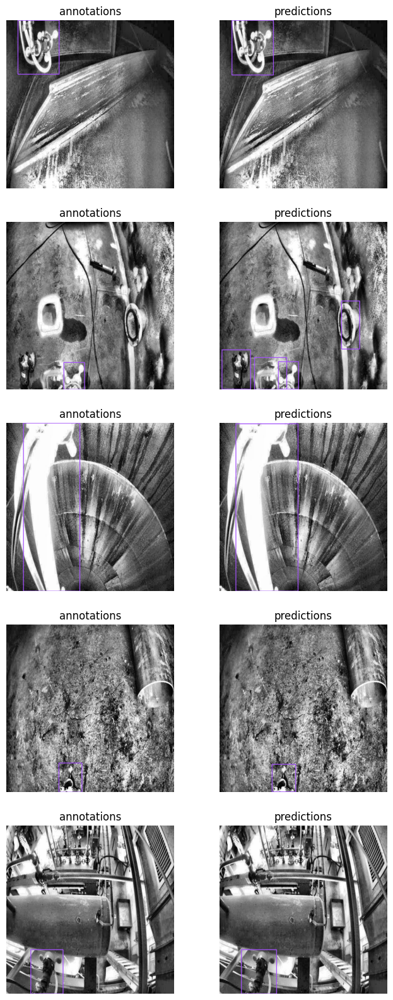

In [ ]:
import supervision as sv

MAX_IMAGE_COUNT = 5

n = min(MAX_IMAGE_COUNT, len(ds.images))

keys = list(ds.images.keys())
keys = random.sample(keys, n)

box_annotator = sv.BoxAnnotator()

images = []
titles = []

for key in keys:
    # Remove 'skip_label=True' as it's not a valid argument
    frame_with_annotations = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=ds.annotations[key],
        # skip_label=True  # Remove this line
    )
    images.append(frame_with_annotations)
    titles.append('annotations')
    # Remove 'skip_label=True' as it's not a valid argument
    frame_with_predictions = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=predictions[key],
        # skip_label=True  # Remove this line
    )
    images.append(frame_with_predictions)
    titles.append('predictions')

%matplotlib inline
sv.plot_images_grid(images=images, titles=titles, grid_size=(n, 2), size=(2 * 4, n * 4))

### Calculate confusion matrix

In [ ]:
!pip install onemetric

SupervisionWarnings: images is deprecated: `DetectionDataset.images` property is deprecated and will be removed in `supervision-0.26.0`. Iterate with `for path, image, annotation in dataset:` instead.


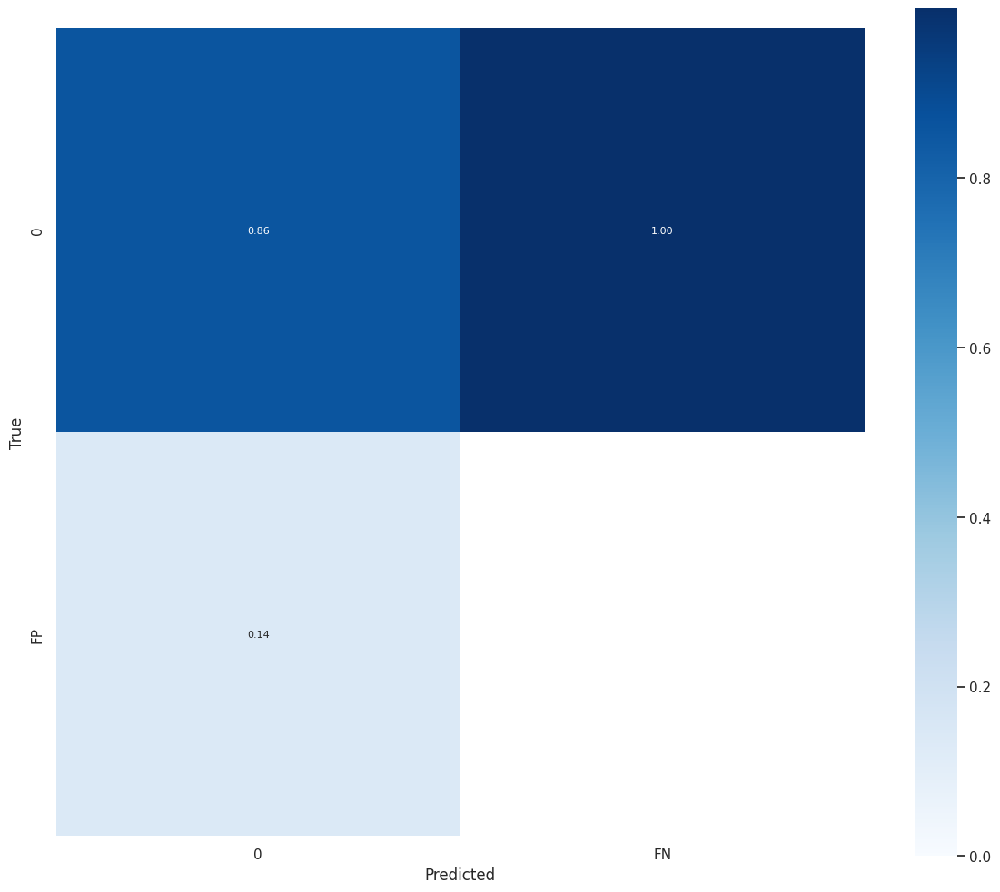

In [61]:
import os

import numpy as np

from onemetric.cv.object_detection import ConfusionMatrix

keys = list(ds.images.keys())

annotation_batches, prediction_batches = [], []

for key in keys:
    annotation=ds.annotations[key]
    annotation_batch = np.column_stack((
        annotation.xyxy,
        annotation.class_id
    ))
    annotation_batches.append(annotation_batch)

    prediction=predictions[key]
    prediction_batch = np.column_stack((
        prediction.xyxy,
        prediction.class_id,
        prediction.confidence
    ))
    prediction_batches.append(prediction_batch)

confusion_matrix = ConfusionMatrix.from_detections(
    true_batches=annotation_batches,
    detection_batches=prediction_batches,
    num_classes=len(ds.classes),
    conf_threshold=CONFIDENCE_TRESHOLD
)

confusion_matrix.plot(os.path.join(HOME, "confusion_matrix.png"), class_names=ds.classes)

t-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

# Training YOLOv8 Object Detection

---

Ultralytics YOLOv8 is a popular version of the YOLO (You Only Look Once) object detection and image segmentation model developed by Ultralytics. The YOLOv8 model is designed to be fast, accurate, and easy to use, making it an excellent choice for a wide range of object detection and image segmentation tasks. It can be trained on large datasets and is capable of running on a variety of hardware platforms, from CPUs to GPUs.

## Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [ ]:
!nvidia-smi

Wed Jan  8 19:05:53 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   68C    P0              29W /  70W |   1859MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

## Install YOLOv8

YOLOv8 can be installed in two ways - from the source and via pip. This is because it is the first iteration of YOLO to have an official package.

In [ ]:
# Pip install method (recommended)

!pip install ultralytics==8.2.103 -q

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image

## Importing Data Set


In [60]:
!mkdir -p {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow==1.1.48 --quiet
import os
HOME = os.getcwd()
print("HOME:", HOME)
from roboflow import Roboflow
from google.colab import userdata

ROBOFLOW_API_KEY = userdata.get('ROBOFLOW_API_KEY')
rf = Roboflow(api_key=ROBOFLOW_API_KEY)

project = rf.workspace("julien-xkm5o").project("probe-detection-fly")
version = project.version(1)
dataset = project.version(1).download("yolov8")

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/engine/trainer.py", line 557, in get_dataset
    data = check_det_dataset(self.args.data)
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/data/utils.py", line 328, in check_det_dataset
    raise FileNotFoundError(m)
FileNotFoundError: 
Dataset '/content/Probe-Detection-FLY-1/data.yaml' images not found ⚠️, missing path '/content/Probe-Detection-FLY-1/Probe-Detection-FLY-1/valid/images'
Note dataset download directory is '/content/datasets'. You can update this in '/root/.config/Ultralytics/settings.json'

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/__init__.py", line 831, in entrypoint
    getattr(model, mode)(**overrides)  # default args from model
  File "/usr/local/lib/python3.10

Extracting Dataset Version Zip to Probe-Detection-FLY-1 in yolov8::  20%|█▉        | 296/1492 [00:00<00:00, 2954.28it/s]

Extracting Dataset Version Zip to Probe-Detection-FLY-1 in yolov8:: 100%|██████████| 1492/1492 [00:00<00:00, 4349.23it/s]


## Custom Training

In [63]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=25 imgsz=800 plots=True

/content/datasets
100% 21.5M/21.5M [00:00<00:00, 196MB/s]
New https://pypi.org/project/ultralytics/8.3.58 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.103 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/datasets/Probe-Detection-FLY-1/data.yaml, epochs=25, time=None, patience=100, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agn

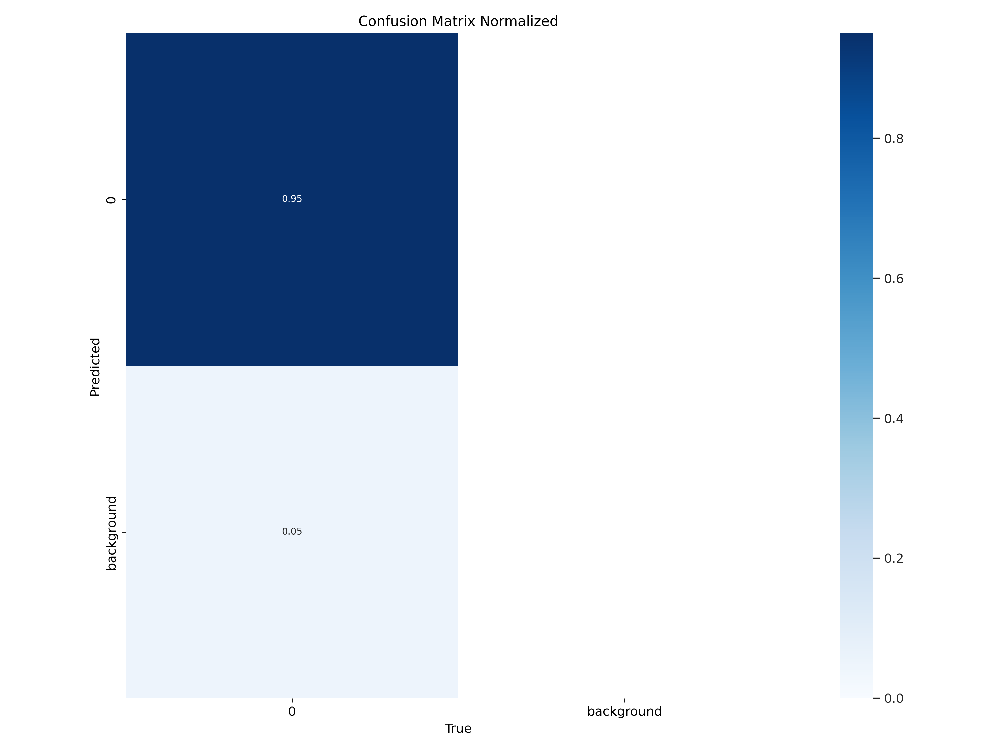

/content/datasets


In [72]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix_normalized.png', width=1000)

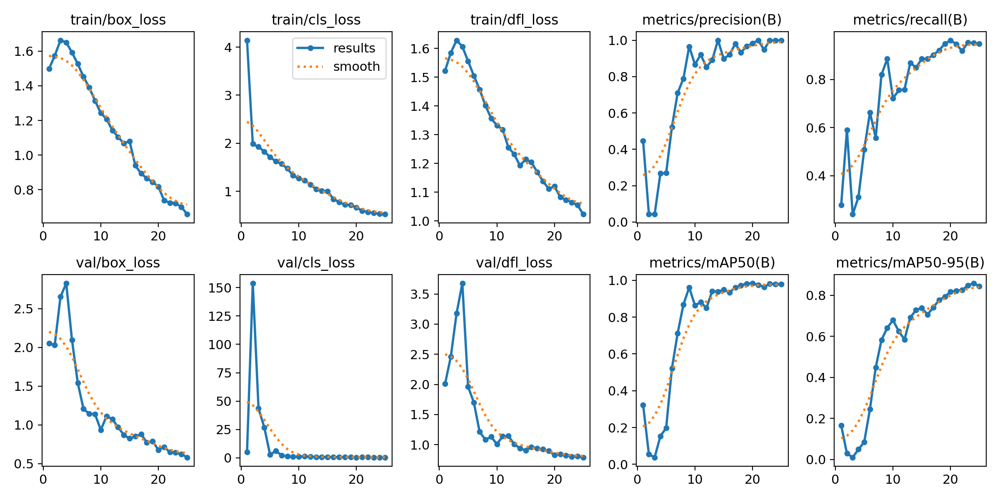

In [65]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)

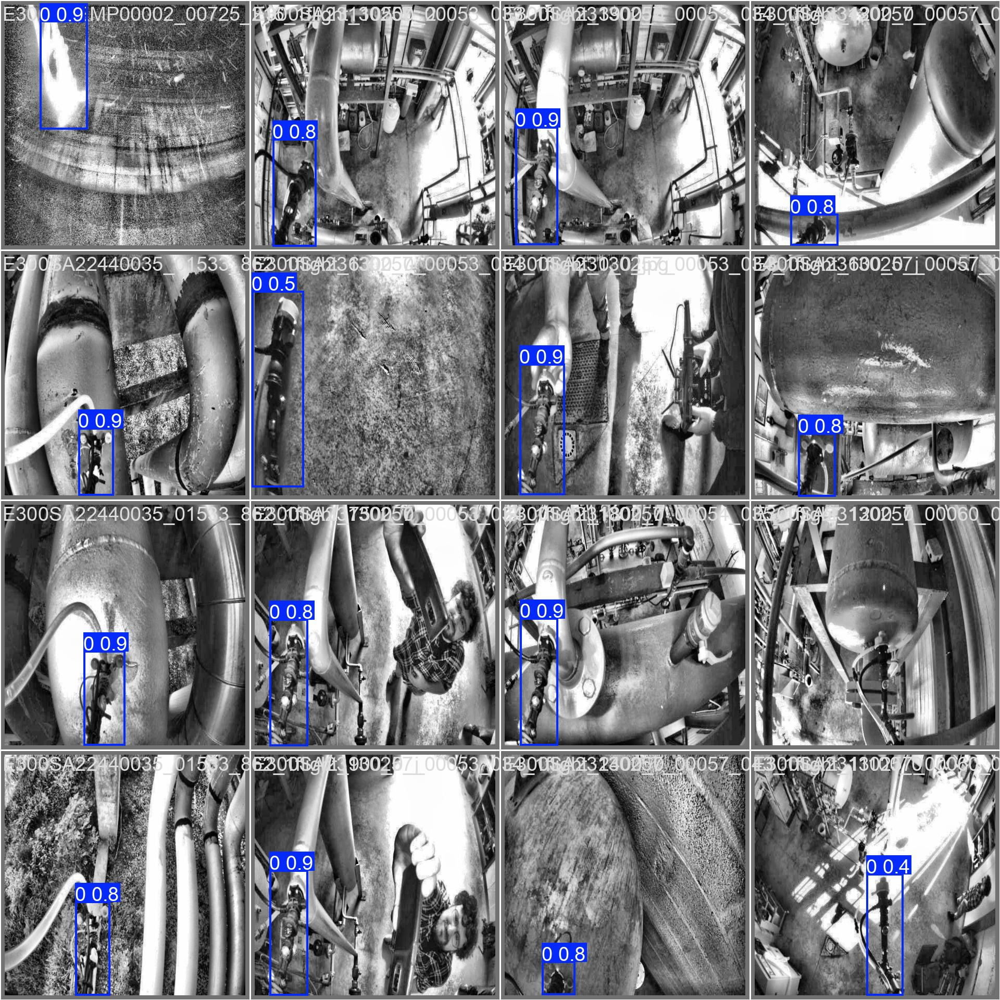

In [66]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width=600)

## Validate Custom Model

In [67]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

/content/datasets
/content/datasets
/content/datasets
/content/datasets
Ultralytics YOLOv8.2.103 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/datasets/Probe-Detection-FLY-1/valid/labels.cache... 61 images, 0 backgrounds, 0 corrupt: 100% 61/61 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 4/4 [00:05<00:00,  1.41s/it]
                   all         61         61      0.998      0.951       0.98      0.853
Speed: 23.5ms preprocess, 19.8ms inference, 0.0ms loss, 15.2ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


## Inference with Custom Model

In [68]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True

/content/datasets
Ultralytics YOLOv8.2.103 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs

image 1/31 /content/datasets/Probe-Detection-FLY-1/test/images/E300PREMP00002_00725_216_1flight_5100_2_jpg.rf.1522ac7412b954e3df6fdd11ff8bac19.jpg: 800x800 1 0, 23.7ms
image 2/31 /content/datasets/Probe-Detection-FLY-1/test/images/E300PREMP00002_00726_217_1flight_12600_2_jpg.rf.51e6feacb94057a1c90e10732f0e39b7.jpg: 800x800 1 0, 23.0ms
image 3/31 /content/datasets/Probe-Detection-FLY-1/test/images/E300PREMP00002_00726_217_1flight_1800_2_jpg.rf.d82bf9174ce69fb8995e47a19ecb8f78.jpg: 800x800 1 0, 22.9ms
image 4/31 /content/datasets/Probe-Detection-FLY-1/test/images/E300PREMP00002_00726_217_1flight_2400_2_jpg.rf.b679758028c46341fc5cfeacc5db574c.jpg: 800x800 1 0, 22.9ms
image 5/31 /content/datasets/Probe-Detection-FLY-1/test/images/E300PREMP00002_00727_218_1flight_11400_2_jpg.rf.9c7ff01750a4df3bedf3e83073

**NOTE:** Let's take a look at few results.

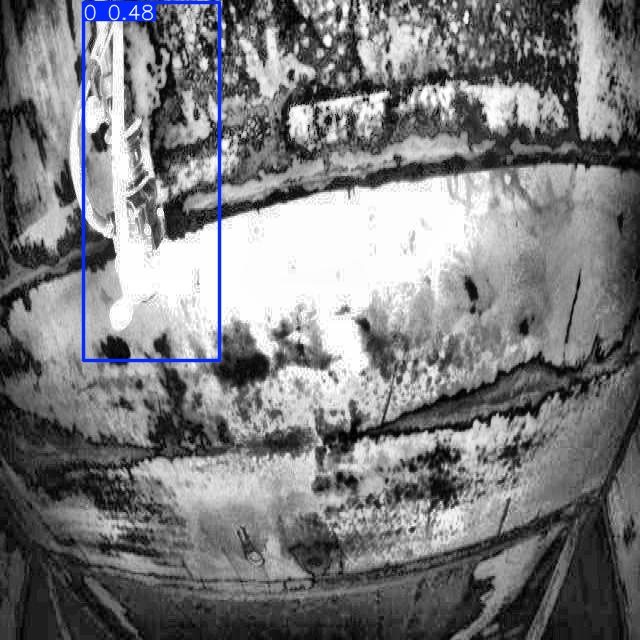

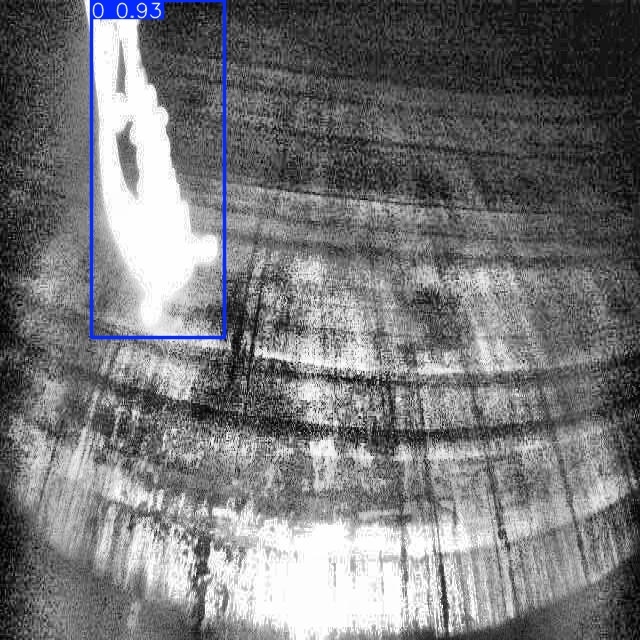

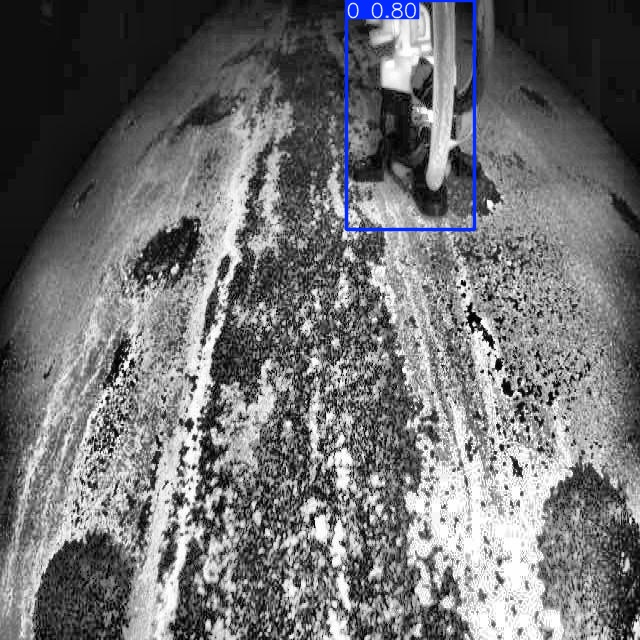

In [83]:
import glob
from IPython.display import Image, display
import os
import os
HOME = os.getcwd()
# Define the base path where the folders are located
base_path = '/content/datasets/runs/detect/'

# List all directories that start with 'predict' in the base path
subfolders = [os.path.join(base_path, d) for d in os.listdir(base_path)
              if os.path.isdir(os.path.join(base_path, d)) and d.startswith('predict')]

# Find the latest folder by modification time
latest_folder = max(subfolders, key=os.path.getmtime)

image_paths = glob.glob(f'{latest_folder}/*.jpg')[:3]

# Display each image
for image_path in image_paths:
    display(Image(filename=image_path, width=600))
    print("\n")

## You have completed to test all three object detection models!
